# 1. A first look at the network:

In [ ]:
install.packages("igraph")


The downloaded binary packages are in
	/var/folders/09/tw3wkmcj1hq79d9pz64k_3380000gn/T//RtmpKgBHS9/downloaded_packages


In [ ]:
library(igraph)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




## 1.1 Report the number of nodes and number of edges of the Facebook network.

pdf 
  2

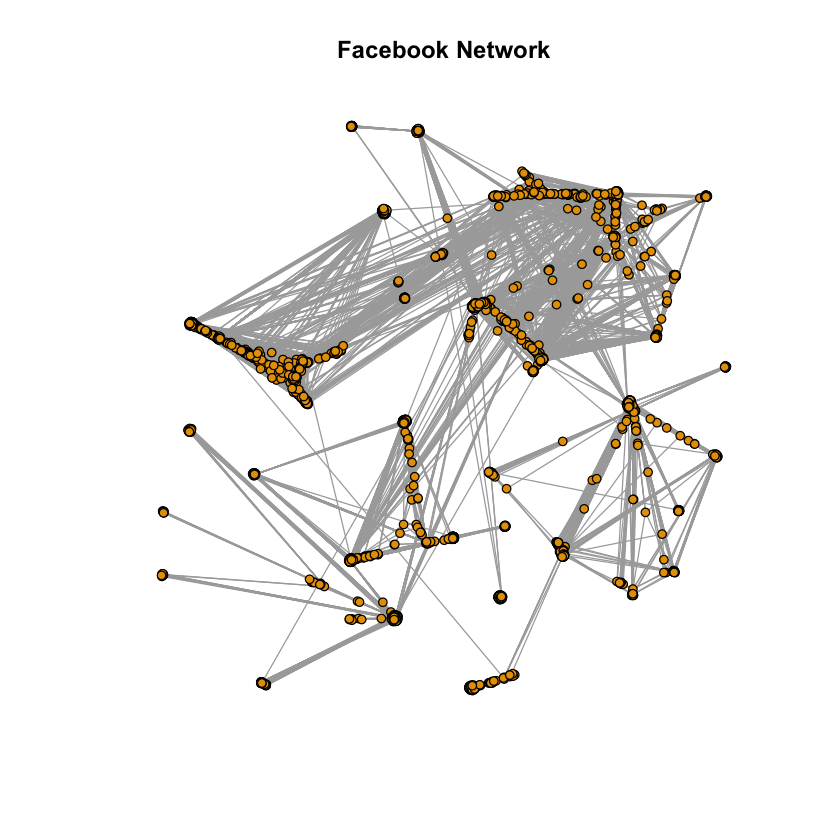

In [ ]:
el <- read.table("facebook_combined.txt")
g <- graph.data.frame(el, directed=FALSE)
plot(g,vertex.label="",vertex.size=3,main = "Facebook Network")
dev.copy2eps(file='Q1_1.eps')

In [ ]:
print(sprintf("Number of nodes: %d", gorder(g)))
print(sprintf("Number of edges: %d", gsize(g)))

[1] "Number of nodes: 4039"
[1] "Number of edges: 88234"


## 1.2 Is the Facebook network connected? If not, find the giant connected component (GCC) of the network and report the size of the GCC.

In [ ]:
is.connected(g)

[1] TRUE

In [ ]:
g.components <- clusters(g)
ix <- which.max(g.components$csize)
g.giant <- induced.subgraph(g, which(g.components$membership == ix))
diameterGCC <- diameter(g.giant, directed = FALSE)
GCCnode <- vcount(g.giant)
GCCedge <- ecount(g.giant)
gccflag = 0

print(sprintf("Diameter of GCC for a random non-connected network: %d", diameterGCC))
print(sprintf("Number of nodes of GCC for a random non-connected network: %d", GCCnode))
print(sprintf("Number of edges of GCC for a random non-connected network: %d", GCCedge))

[1] "Diameter of GCC for a random non-connected network: 8"
[1] "Number of nodes of GCC for a random non-connected network: 4039"
[1] "Number of edges of GCC for a random non-connected network: 88234"


# 2. Find the diameter of the network. If the network is not connected, then find the diameter of the GCC.

In [ ]:
print("The diameter of the network is:")
print(diameter(g))

[1] "The diameter of the network is:"
[1] 8


# 3. Plot the degree distribution of the facebook network and report the average degree.

pdf 
  2

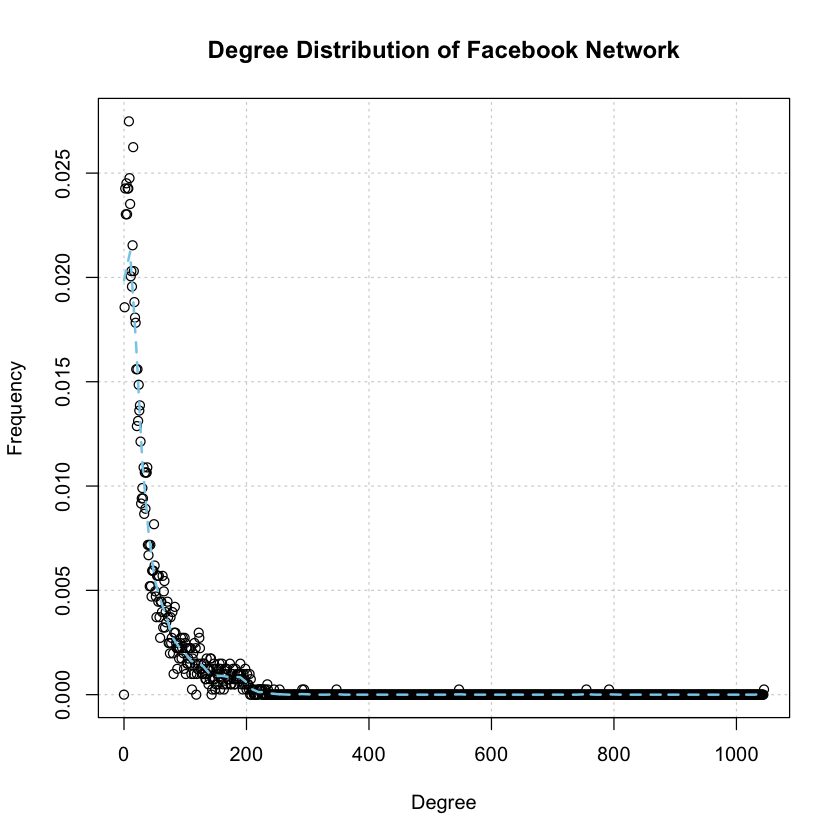

In [ ]:
plot(seq_along(degree.distribution(g)) - 1, degree.distribution(g),
    main = "Degree Distribution of Facebook Network", xlab = "Degree", ylab = "Frequency", grid())
lines(lowess(seq_along(degree.distribution(g))-1, degree.distribution(g),f = 0.027), col = "skyblue", lwd = 2, lty = 2)
dev.copy2eps(file='Q3.eps')

In [ ]:
print(sprintf("Average degree: %f", mean(degree(g))))

[1] "Average degree: 43.691013"


# 4. Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to the plot and estimate the slope of the line.

pdf 
  2

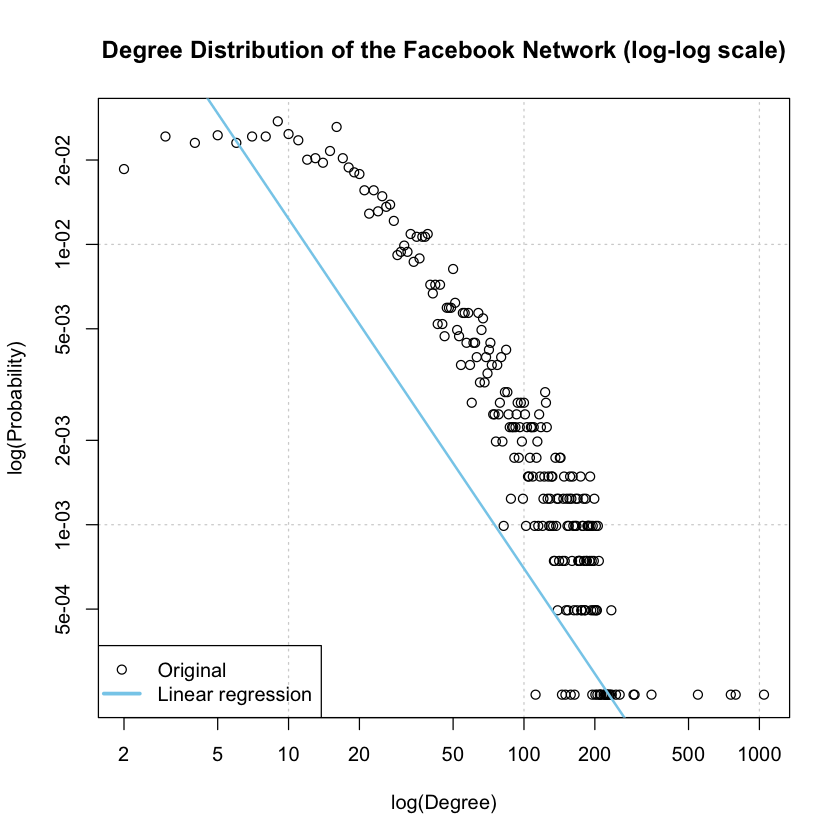

In [ ]:
deg_dist = degree.distribution(g)
deg <- c(1:length(deg_dist))[which(deg_dist != 0, arr.ind = TRUE)]
dist <- deg_dist[which(deg_dist != 0, arr.ind = TRUE)]
plot(deg,dist, main = "Degree Distribution of the Facebook Network (log-log scale)",
    xlab = "log(Degree)", ylab = "log(Probability)", grid(), col = "black", log = "xy")
abline(lm(log(dist) ~ log(deg)), col = "skyblue", lwd = 2)
legend('bottomleft', legend = c("Original", "Linear regression"),
       lty = c(0, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('black','skyblue'))
dev.copy2eps(file='Q4.eps')

In [ ]:
print("Slope and intercept for the line")
print(lm(log(dist) ~ log(deg)))

[1] "Slope and intercept for the line"

Call:
lm(formula = log(dist) ~ log(deg))

Coefficients:
(Intercept)     log(deg)  
    -0.6611      -1.2475  



### Question 5

png 
  2

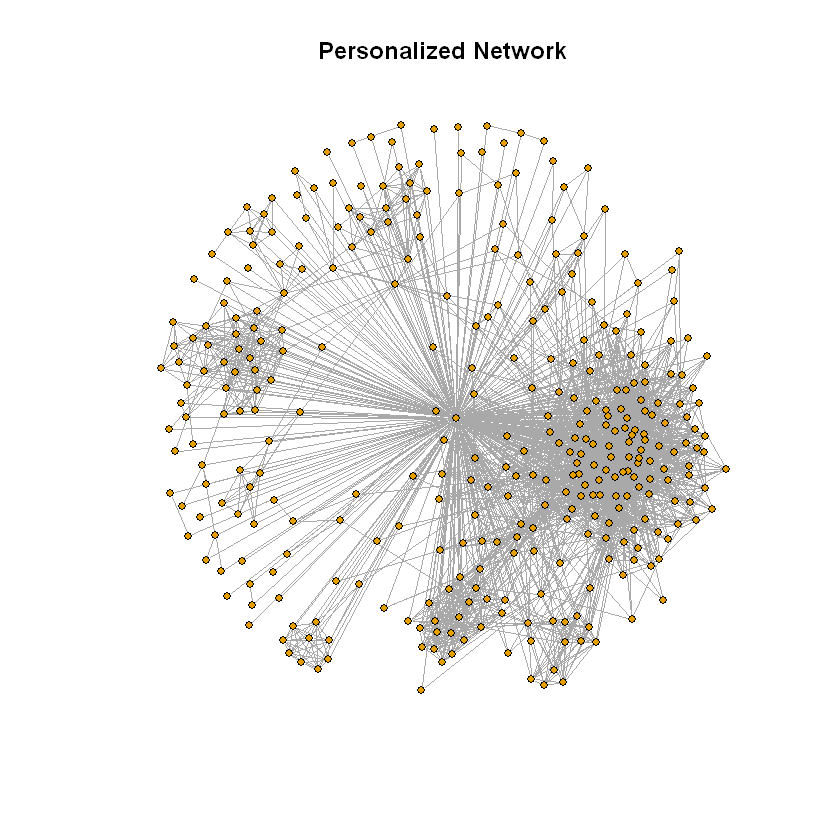

In [ ]:
eg = make_ego_graph(g, order = 1, nodes = V(g), mindist = 0)[[1]]
plot(eg,vertex.label="",vertex.size=3,main = "Personalized Network")
dev.copy2eps(file='Q5.eps')

In [ ]:
print(sprintf("Number of nodes: %d",gorder(eg)))
print(sprintf("Number of edges: %d", gsize(eg)))

[1] "Number of nodes: 348"
[1] "Number of edges: 2866"


### Question 6

In [ ]:
print(diameter(eg))

[1] 2


### Question 8

In [ ]:
coreNodes <- which(neighborhood.size(g,1,nodes=V(g))>201)
print(length(coreNodes))
degCoreNodes <- mean(degree(g, v=V(g)[coreNodes]))
print(degCoreNodes)

[1] 40
[1] 279.375


### Question 9

In [ ]:
node_list <- c(1, 349,484,1087,108)
print(node_list[5])
g <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)
eg <- make_ego_graph(g, order = 1, nodes = V(g)[node_list])

[1] 108


[1] "Modularity, Fast Greedy, Node ID: 1: 0.413101"
[1] "Modularity, Edge-Betweenness, Node ID: 1: 0.353302"
[1] "Modularity, Infomap, Node ID: 1: 0.389118"


png 
  2

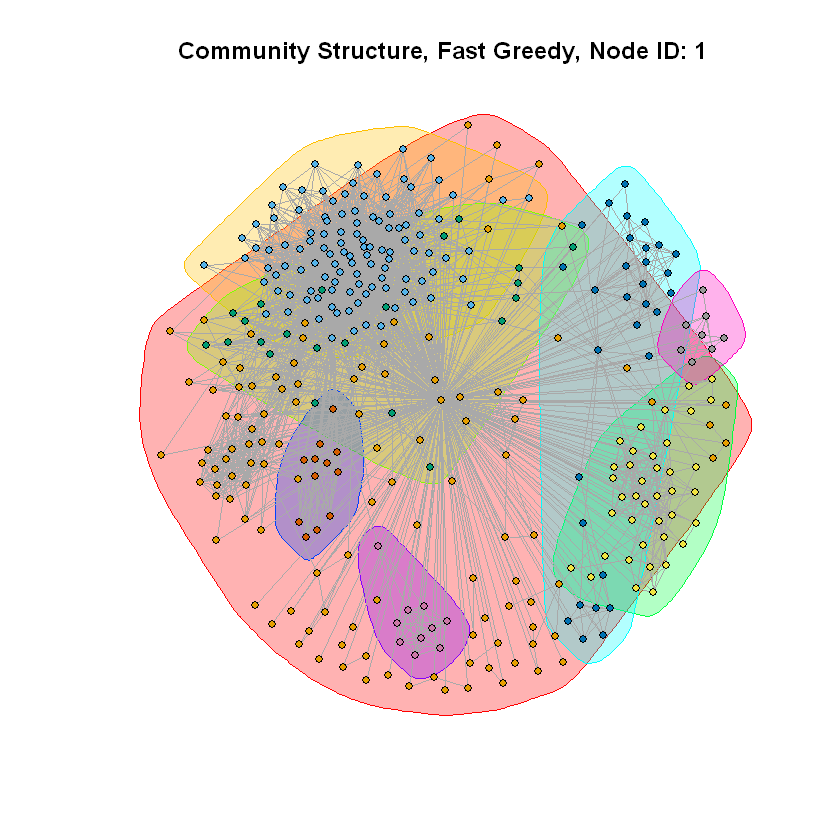

png 
  2

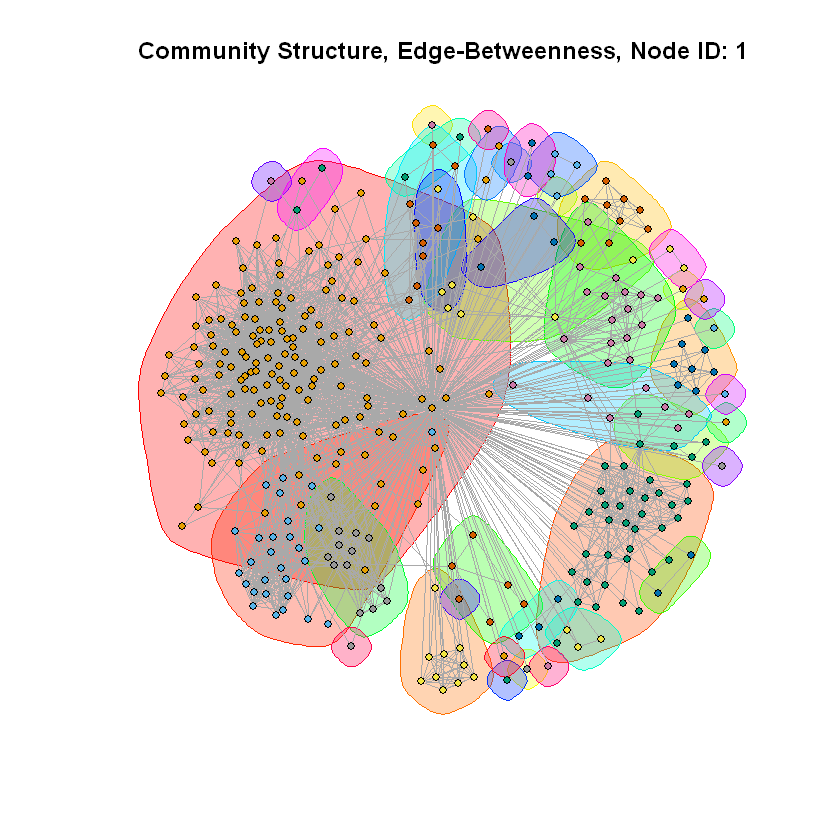

png 
  2

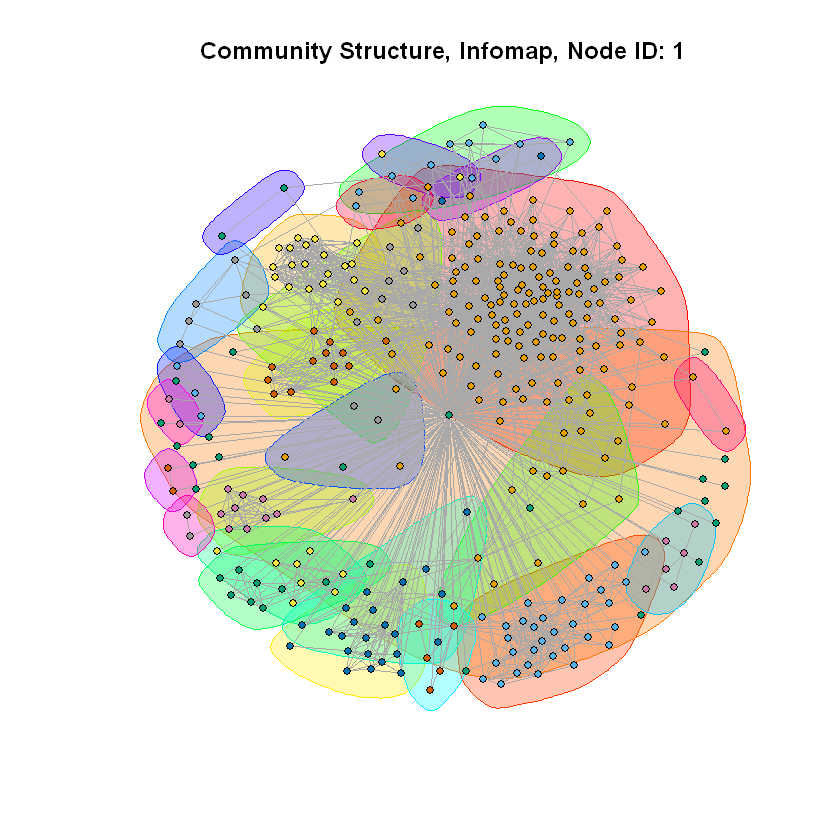

In [ ]:
i = 1
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 349: 0.251715"
[1] "Modularity, Edge-Betweenness, Node ID: 349: 0.133528"
[1] "Modularity, Infomap, Node ID: 349: 0.096029"


png 
  2

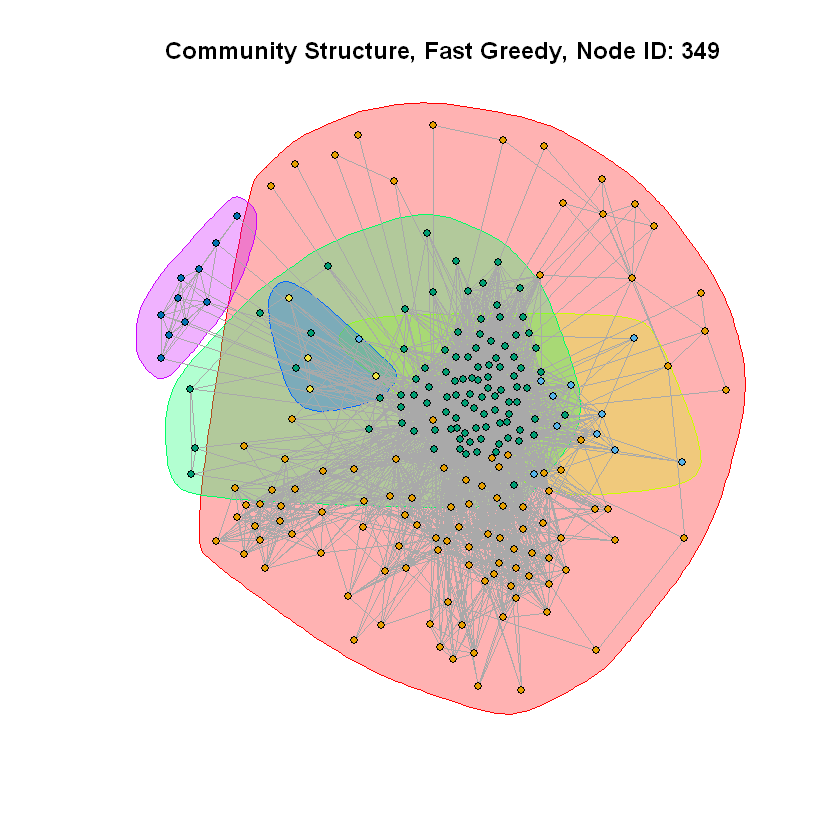

png 
  2

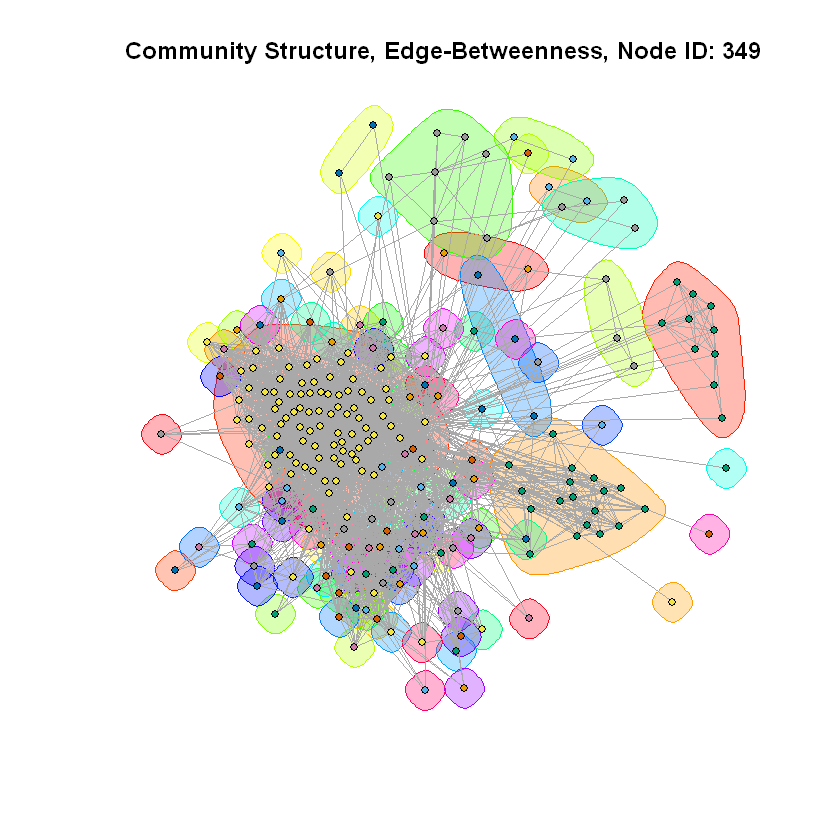

png 
  2

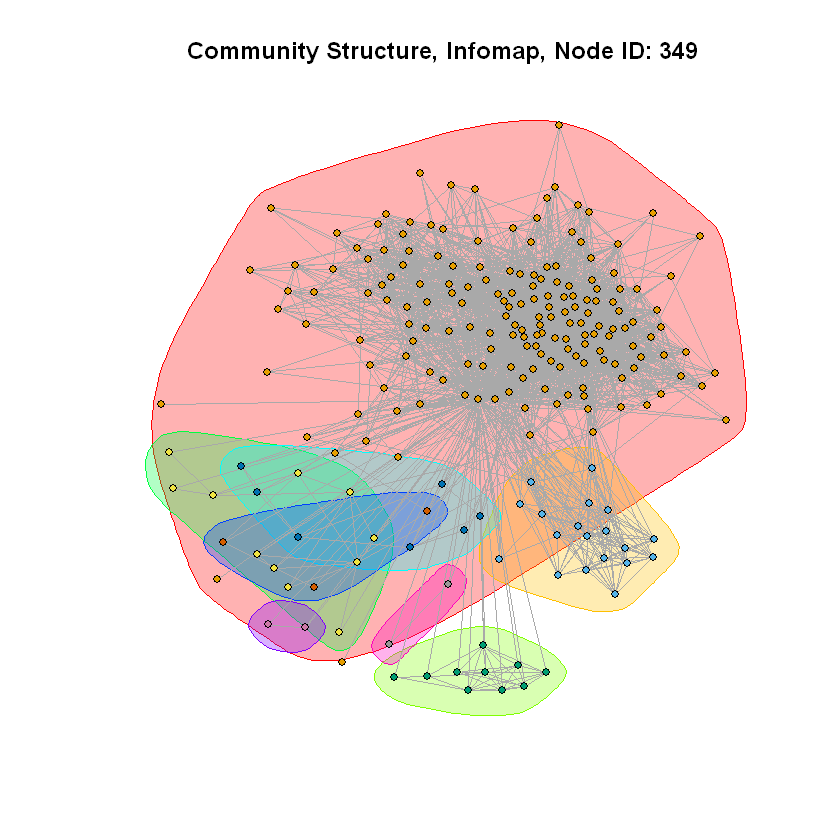

In [ ]:
i = 2
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 484: 0.507002"
[1] "Modularity, Edge-Betweenness, Node ID: 484: 0.489095"
[1] "Modularity, Infomap, Node ID: 484: 0.515279"


png 
  2

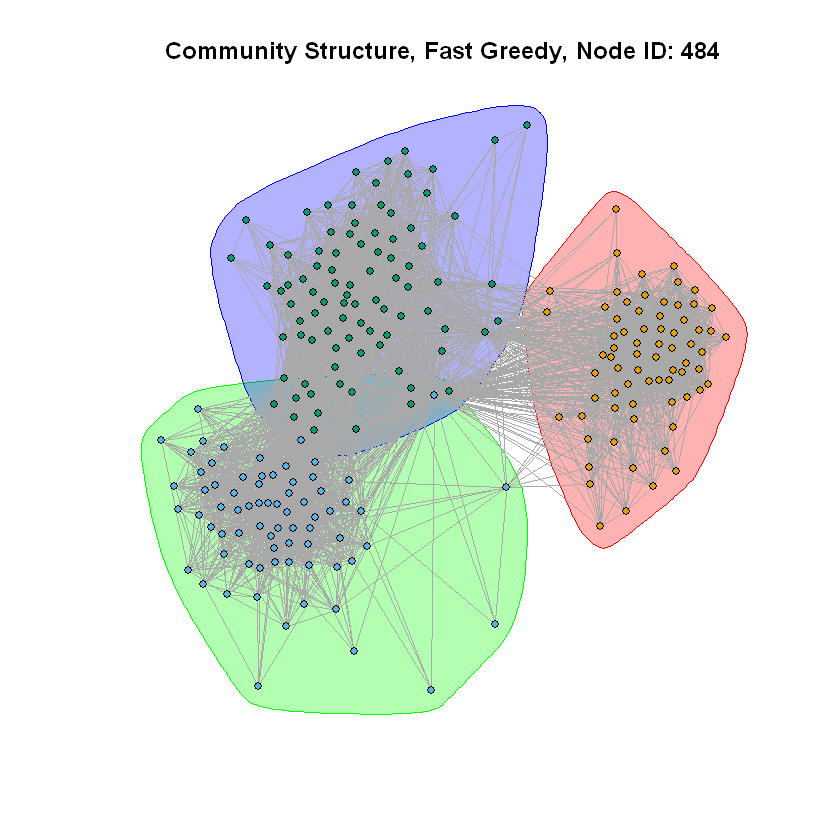

png 
  2

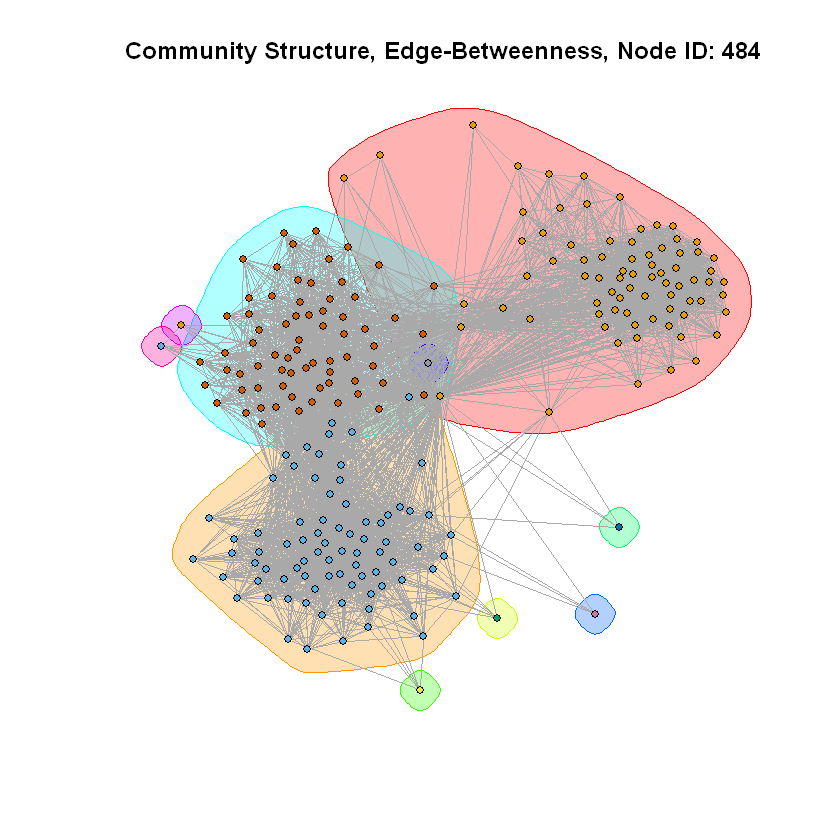

png 
  2

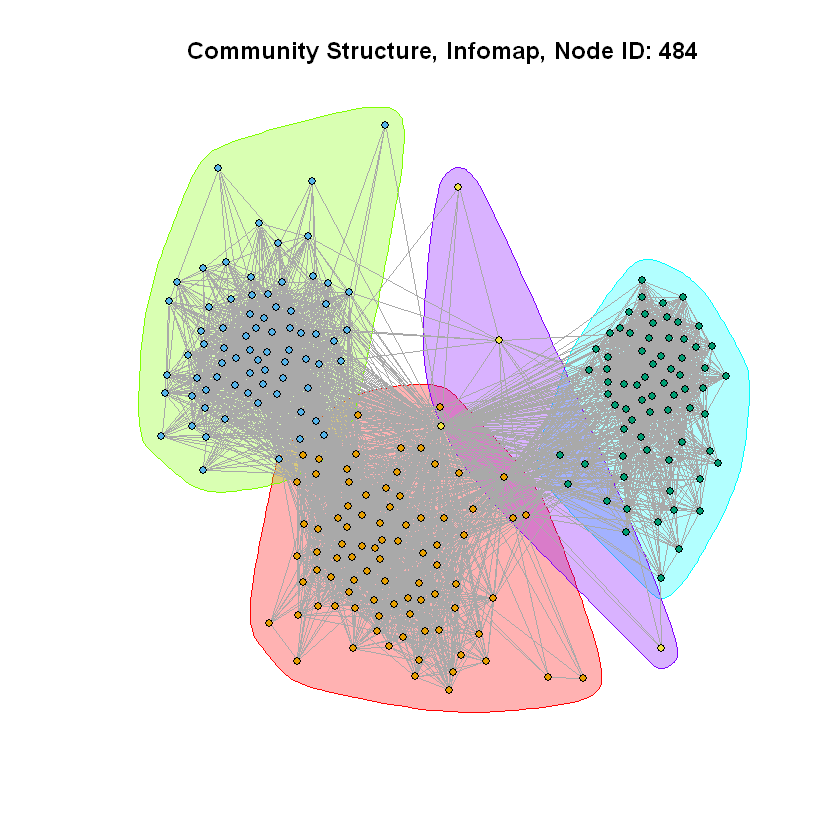

In [ ]:
i = 3
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 1087: 0.145531"
[1] "Modularity, Edge-Betweenness, Node ID: 1087: 0.027624"
[1] "Modularity, Infomap, Node ID: 1087: 0.026907"


png 
  2

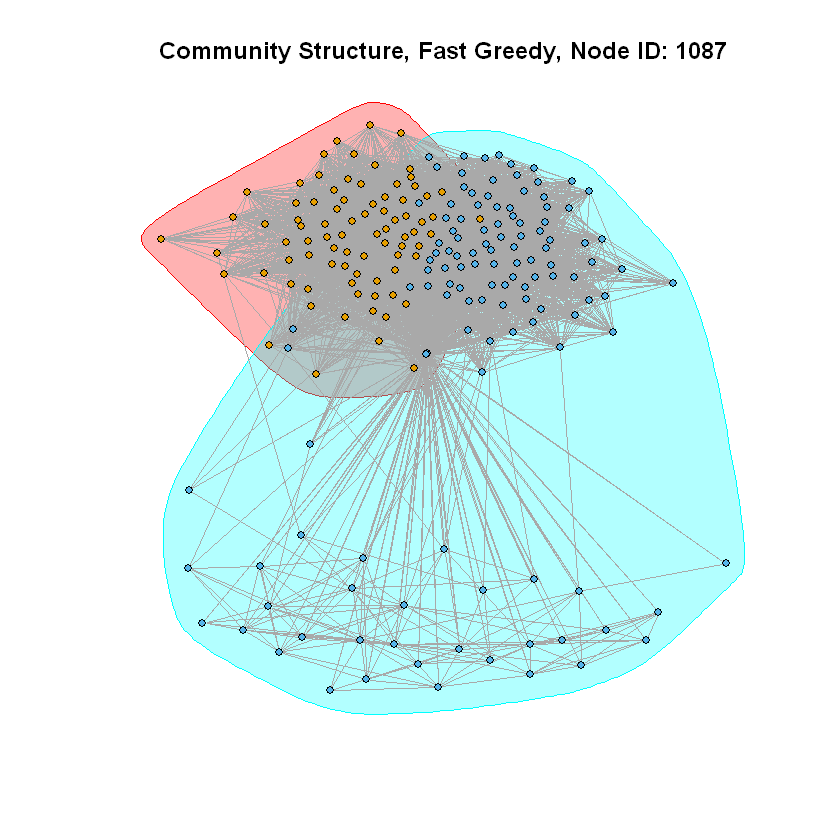

png 
  2

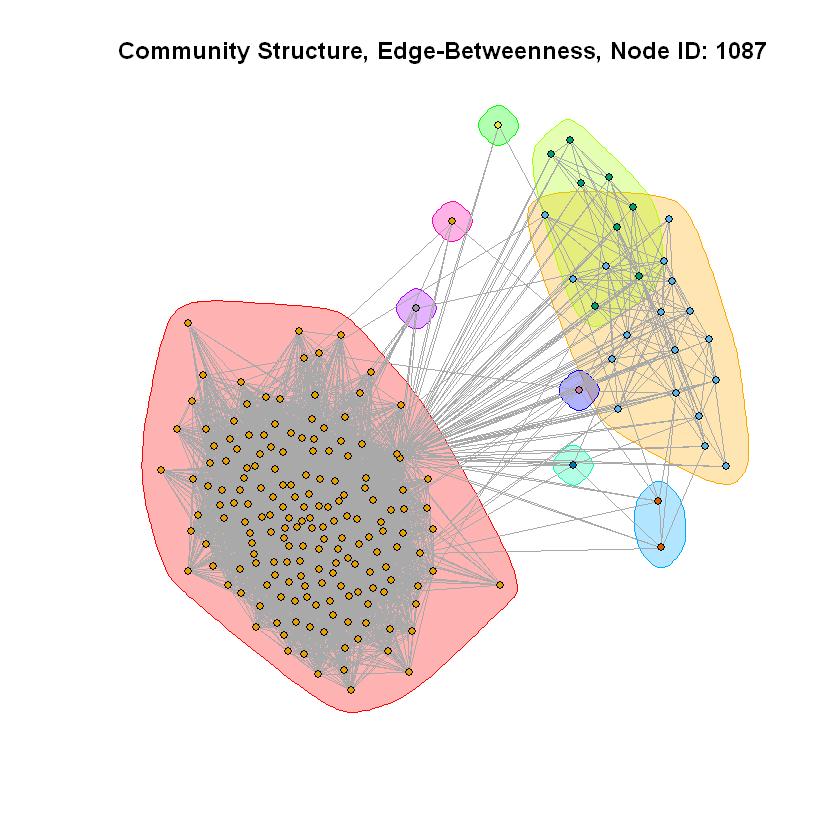

png 
  2

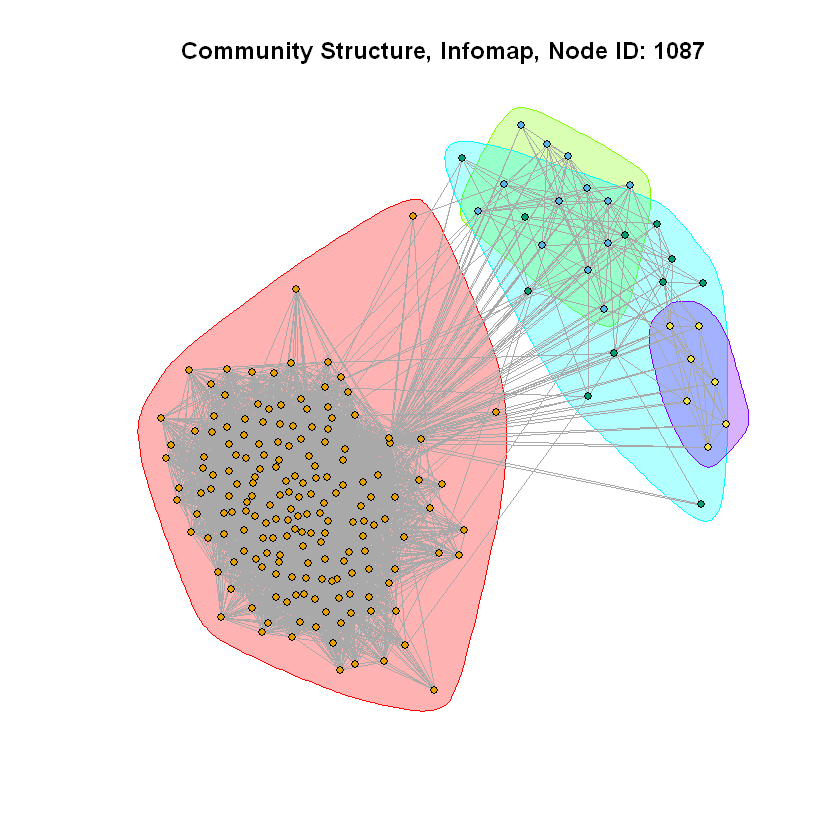

In [ ]:
i = 4
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

### Question 9

In [ ]:
node_list <- c(1, 349,484,1087,108)
print(node_list[5])
g <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)
eg <- make_ego_graph(g, order = 1, nodes = V(g)[node_list])

[1] 108


[1] "Modularity, Fast Greedy, Node ID: 1: 0.413101"
[1] "Modularity, Edge-Betweenness, Node ID: 1: 0.353302"
[1] "Modularity, Infomap, Node ID: 1: 0.389118"


png 
  2

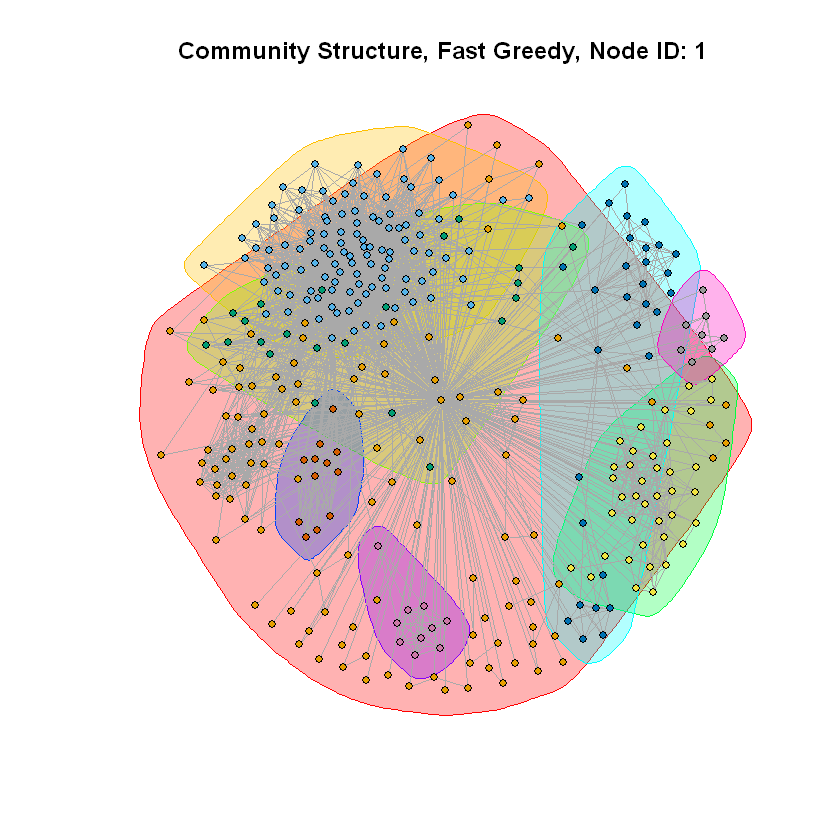

png 
  2

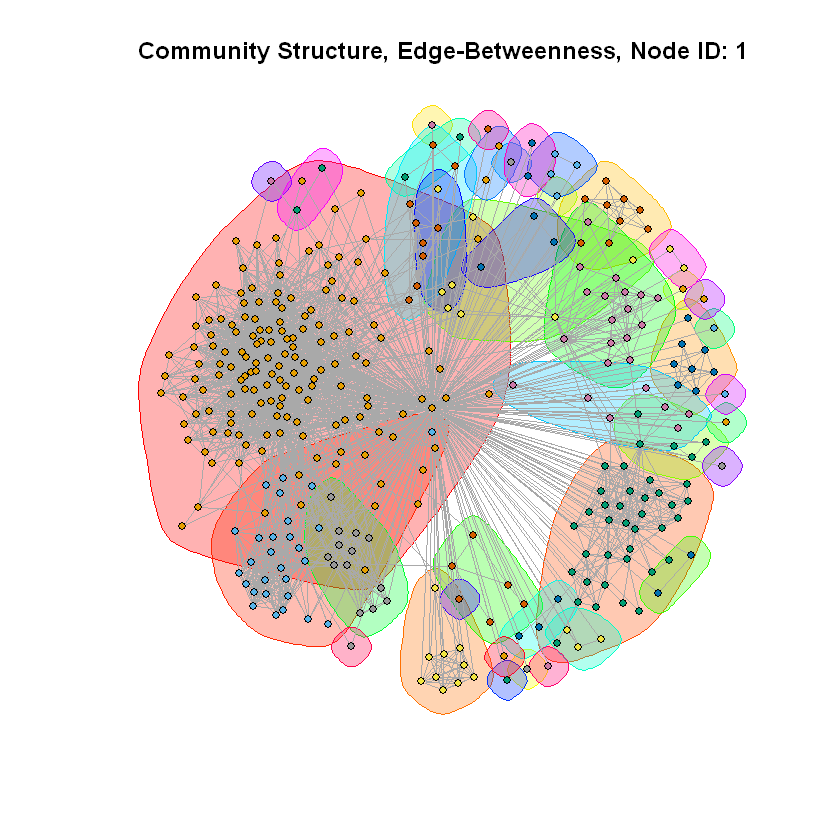

png 
  2

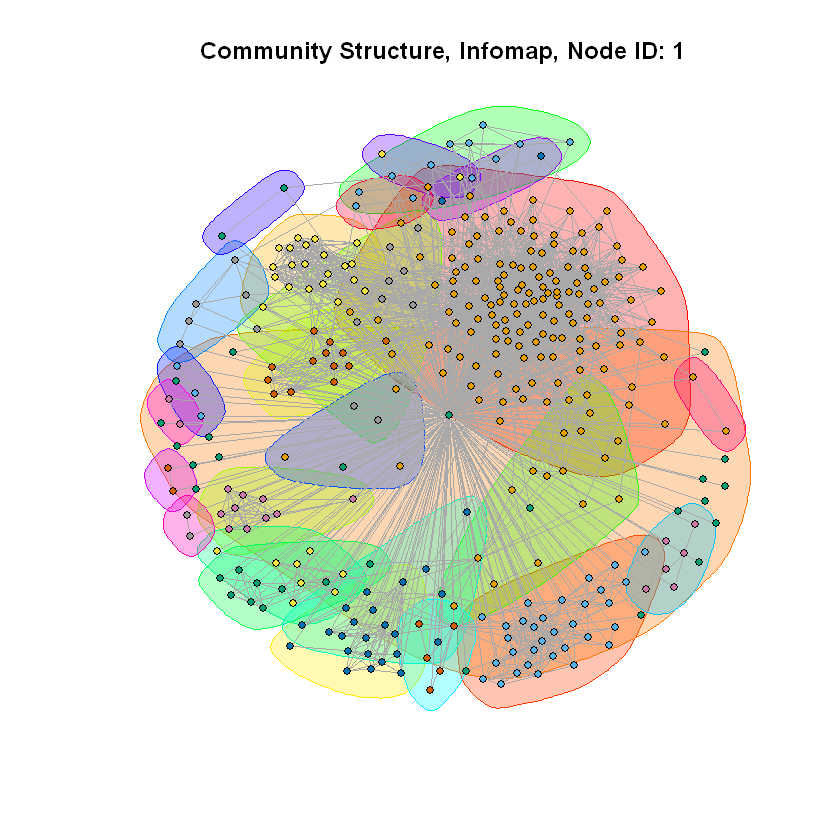

In [ ]:
i = 1
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 349: 0.251715"
[1] "Modularity, Edge-Betweenness, Node ID: 349: 0.133528"
[1] "Modularity, Infomap, Node ID: 349: 0.096029"


png 
  2

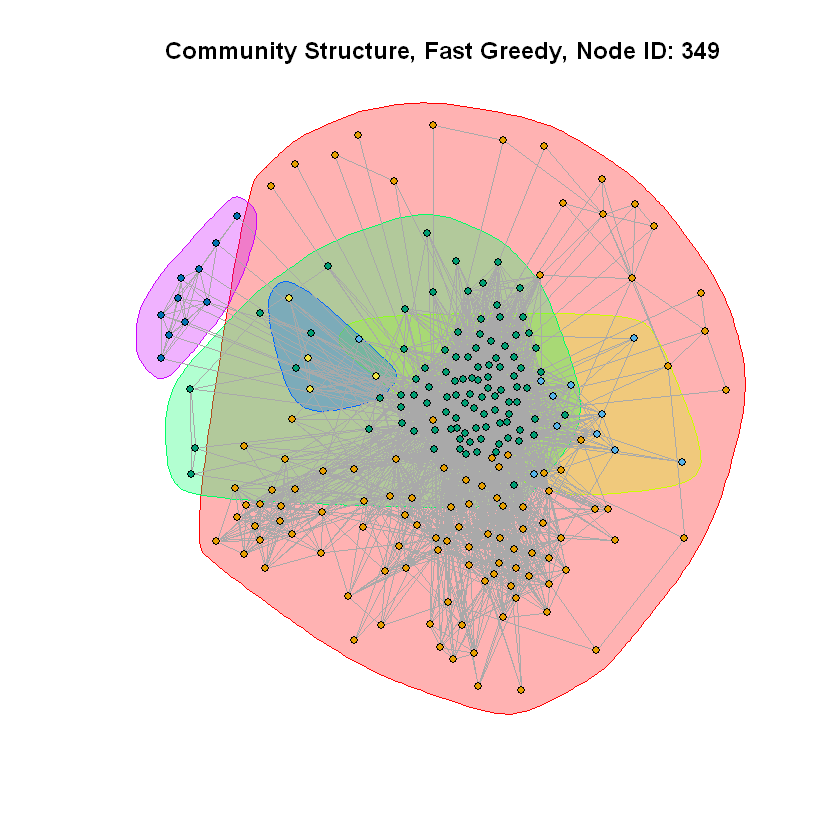

png 
  2

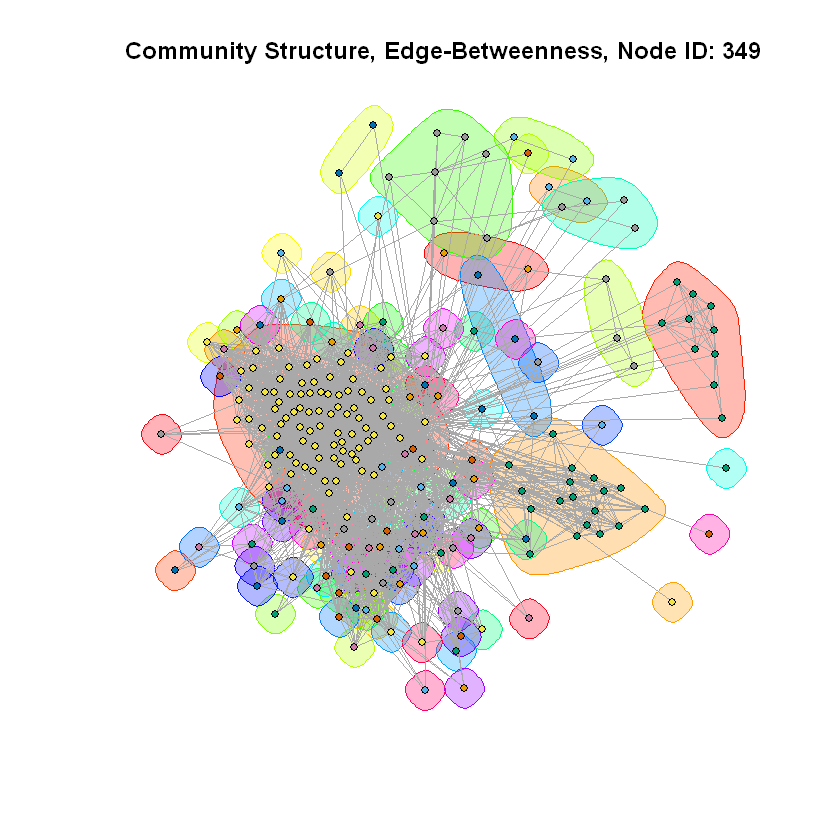

png 
  2

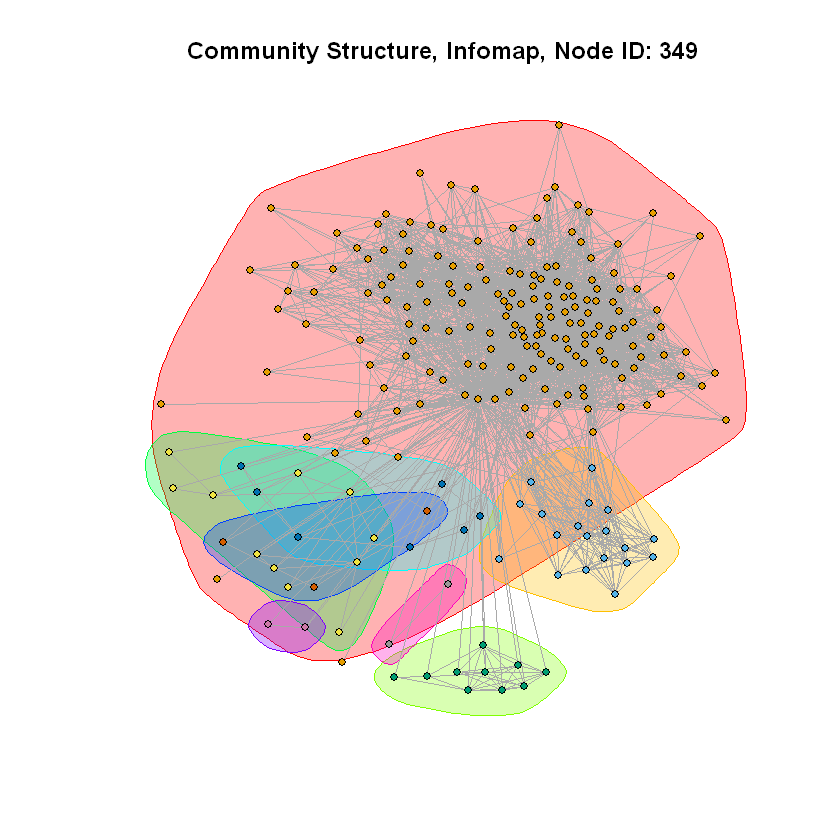

In [ ]:
i = 2
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 484: 0.507002"
[1] "Modularity, Edge-Betweenness, Node ID: 484: 0.489095"
[1] "Modularity, Infomap, Node ID: 484: 0.515279"


png 
  2

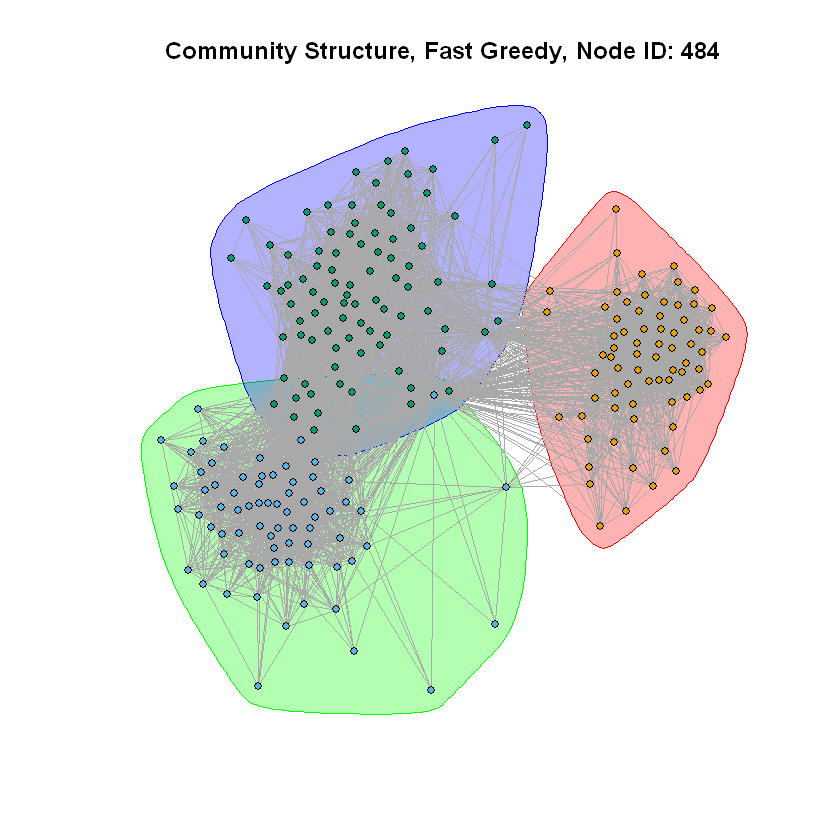

png 
  2

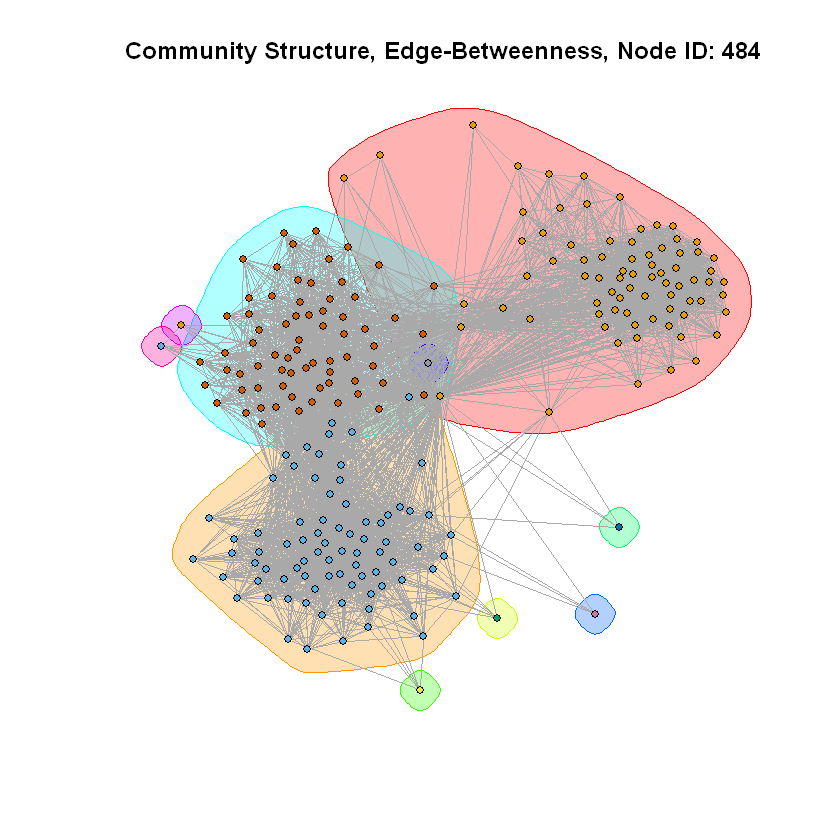

png 
  2

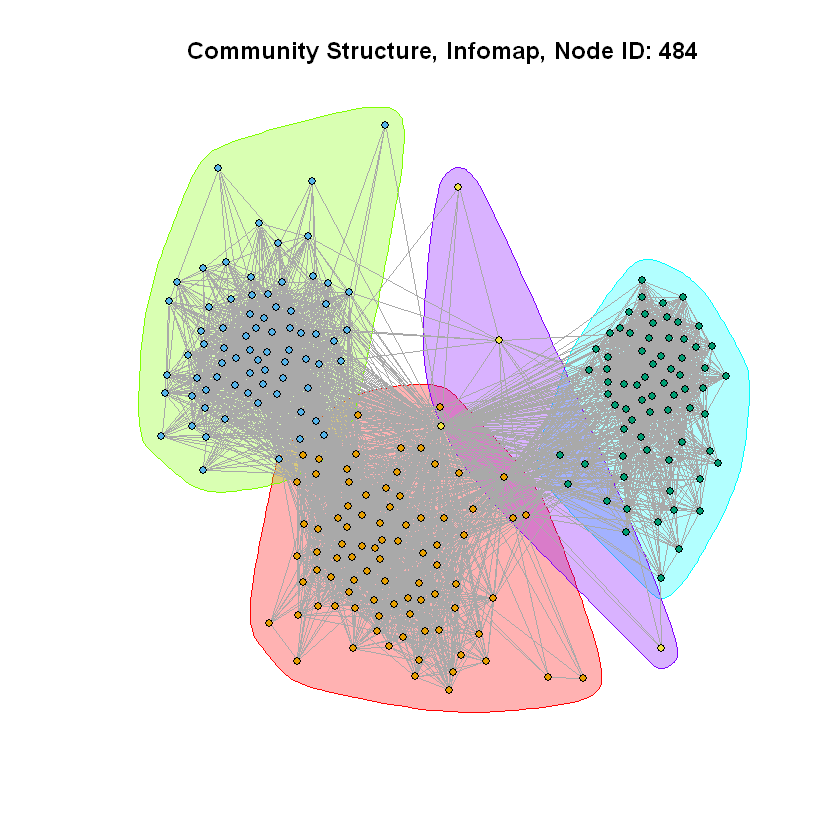

In [ ]:
i = 3
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID: 1087: 0.145531"
[1] "Modularity, Edge-Betweenness, Node ID: 1087: 0.027624"
[1] "Modularity, Infomap, Node ID: 1087: 0.026907"


png 
  2

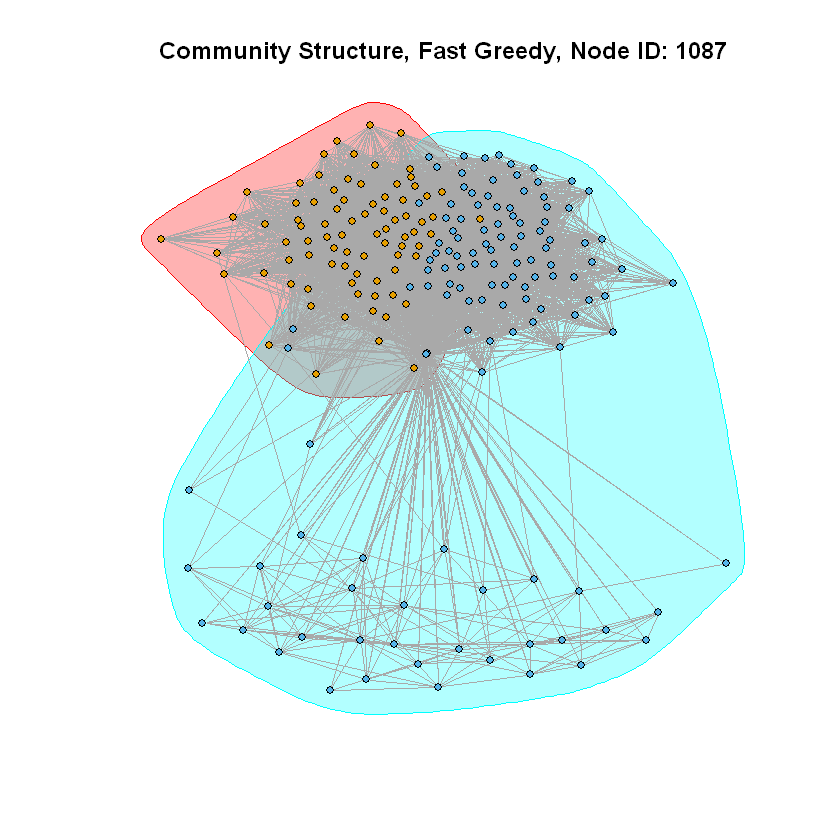

png 
  2

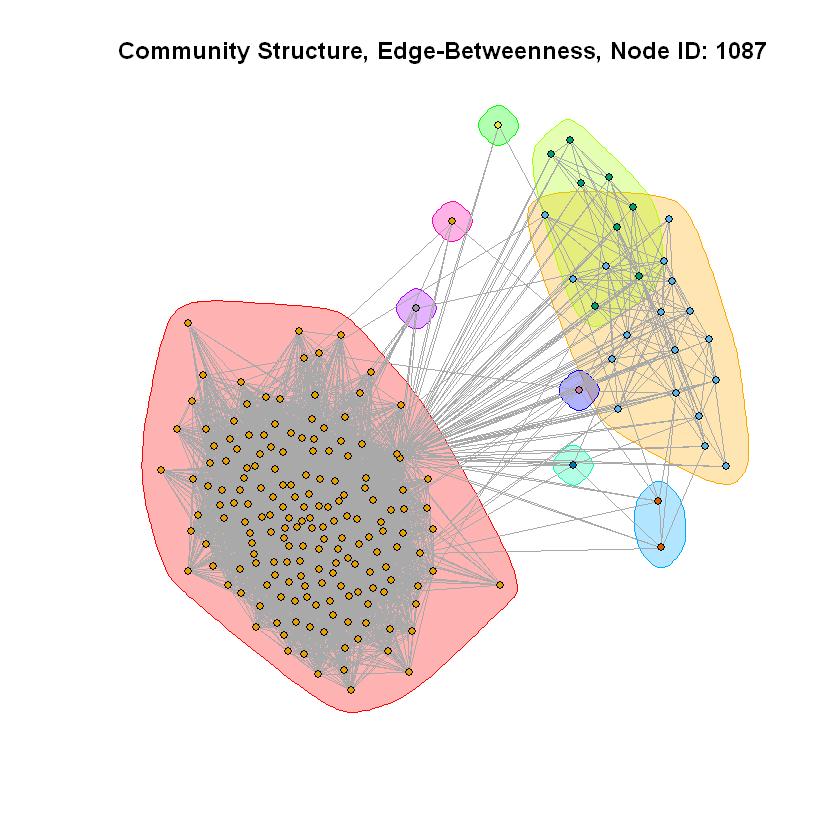

png 
  2

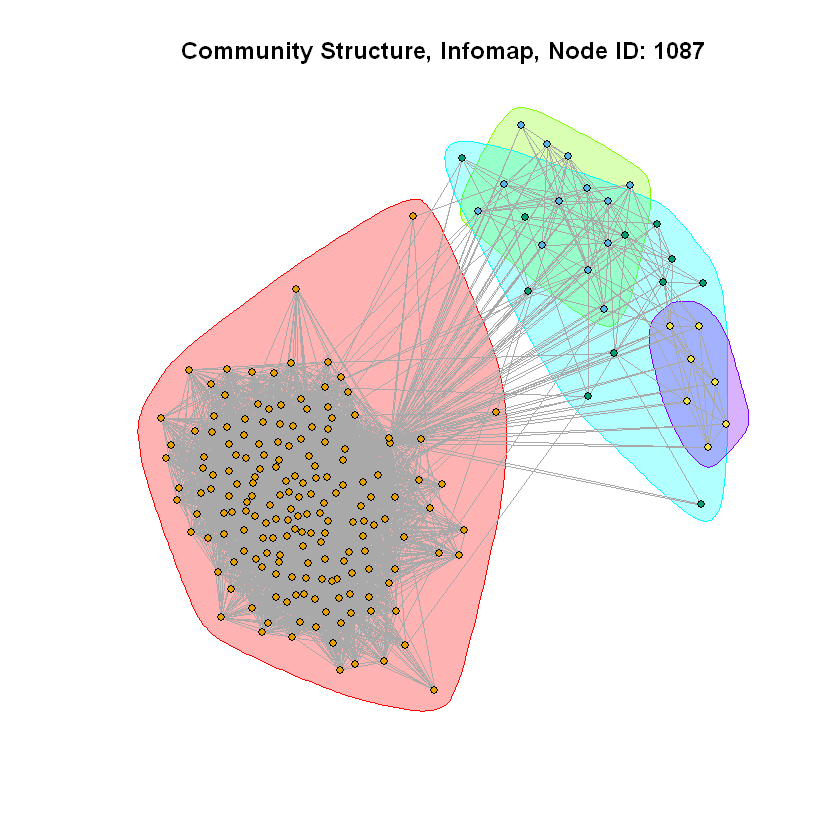

In [ ]:
i = 4
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q9imc%d.pdf',node_list[i]))

In [ ]:
node_list <- c(1,349,484,1087,108)
g <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)
eg <- make_ego_graph(g, order = 1, nodes = V(g)[node_list])

[1] "Modularity, Fast Greedy, Node ID: 108: 0.435929"
[1] "Modularity, Edge-Betweenness, Node ID: 108: 0.506755"
[1] "Modularity, Infomap, Node ID: 108: 0.508223"


Warning message in grDevices::dev.copy(file = sprintf("Q9fc%d.eps", node_list[i]), :
“semi-transparency is not supported on this device: reported only once per page”

pdf 
  2

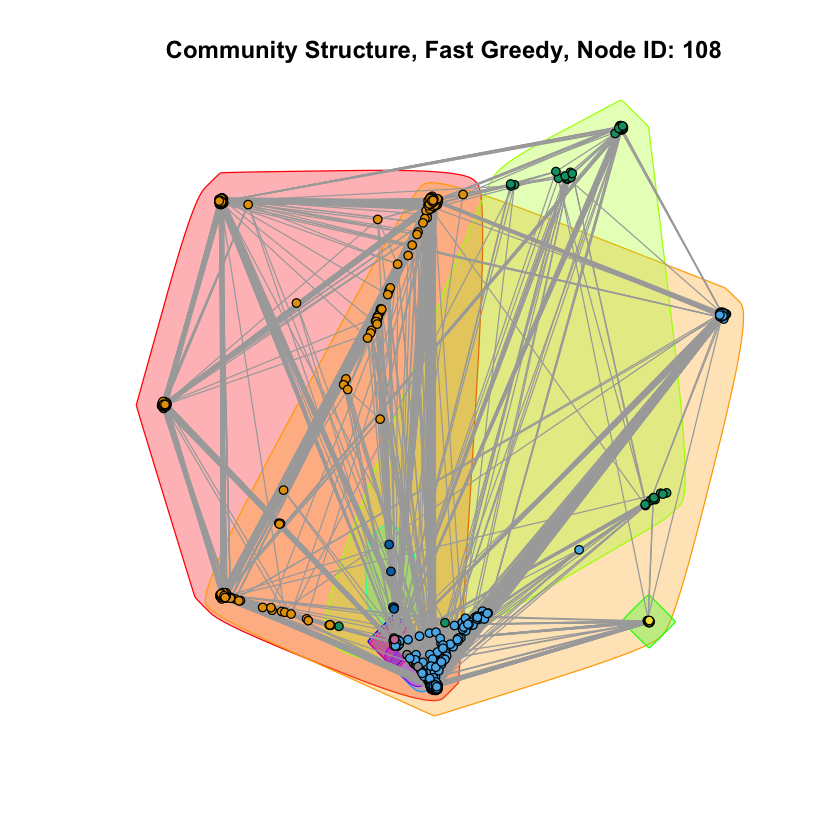

Warning message in grDevices::dev.copy(file = sprintf("Q9eb%d.eps", node_list[i]), :
“semi-transparency is not supported on this device: reported only once per page”

pdf 
  2

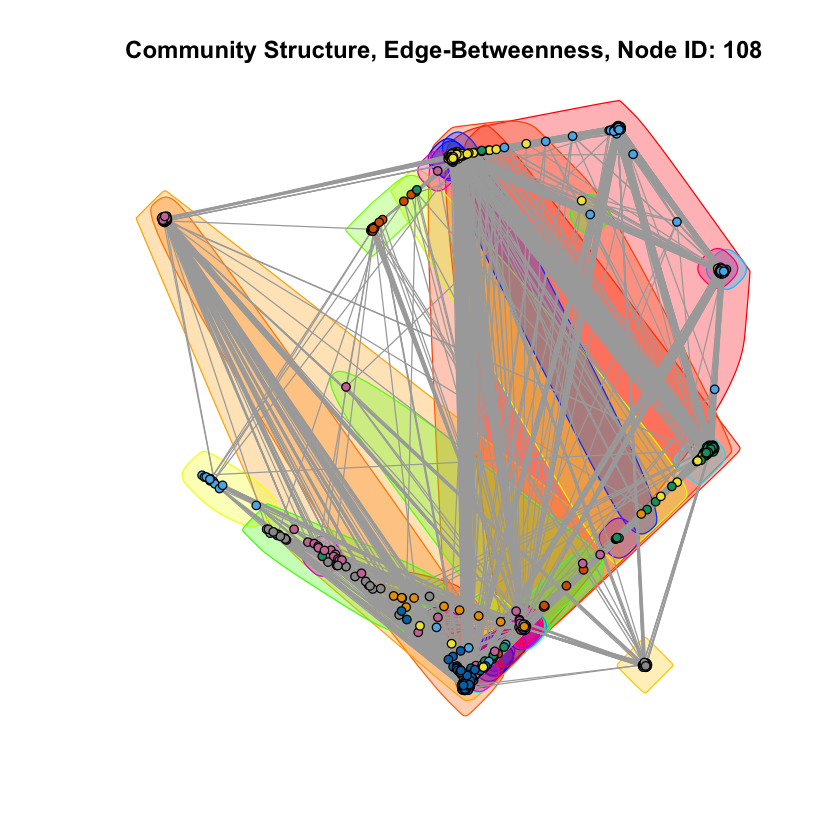

Warning message in grDevices::dev.copy(file = sprintf("Q9imc%d.eps", node_list[i]), :
“semi-transparency is not supported on this device: reported only once per page”

pdf 
  2

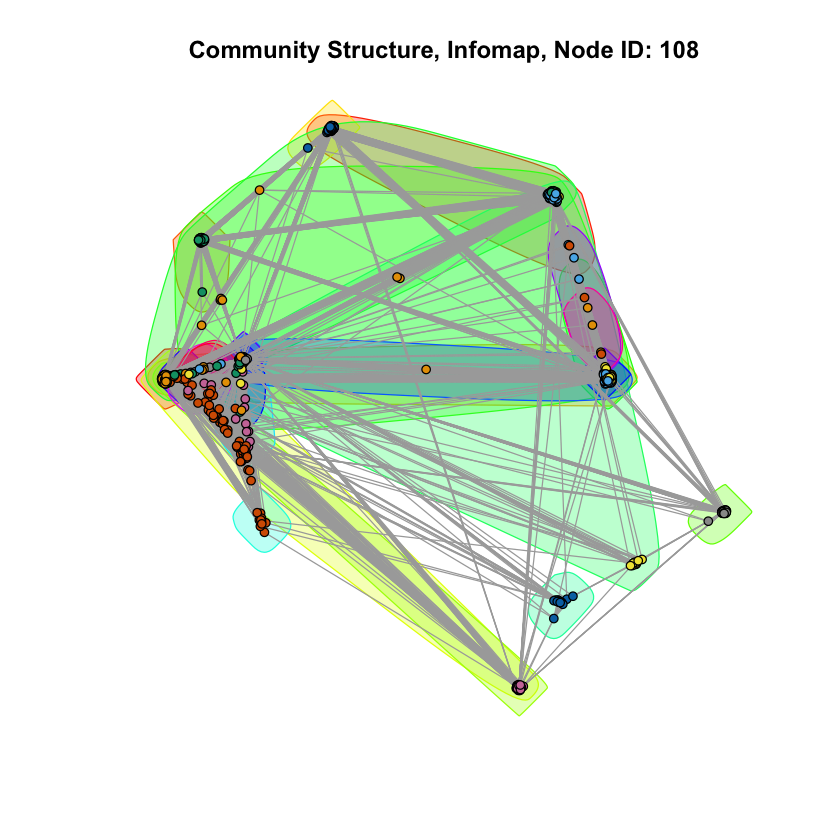

In [ ]:
i = 5
net = eg[[i]]
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID: %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID: %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID: %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, Node ID: %d", node_list[i]))
dev.copy2eps(file=sprintf('Q9fc%d.eps',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,vertex.color=eb$membership,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, Node ID: %d", node_list[i]))
dev.copy2eps(file=sprintf('Q9eb%d.eps',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, Node ID: %d", node_list[i]))
dev.copy2eps(file=sprintf('Q9imc%d.eps',node_list[i]))

### Question 10

[1] "Modularity, Fast Greedy, Node ID (without core node): 1: 0.441853"
[1] "Modularity, Edge-Betweenness, Node ID (without core node): 1: 0.416146"
[1] "Modularity, Infomap, Node ID (without core node): 1: 0.418008"


png 
  2

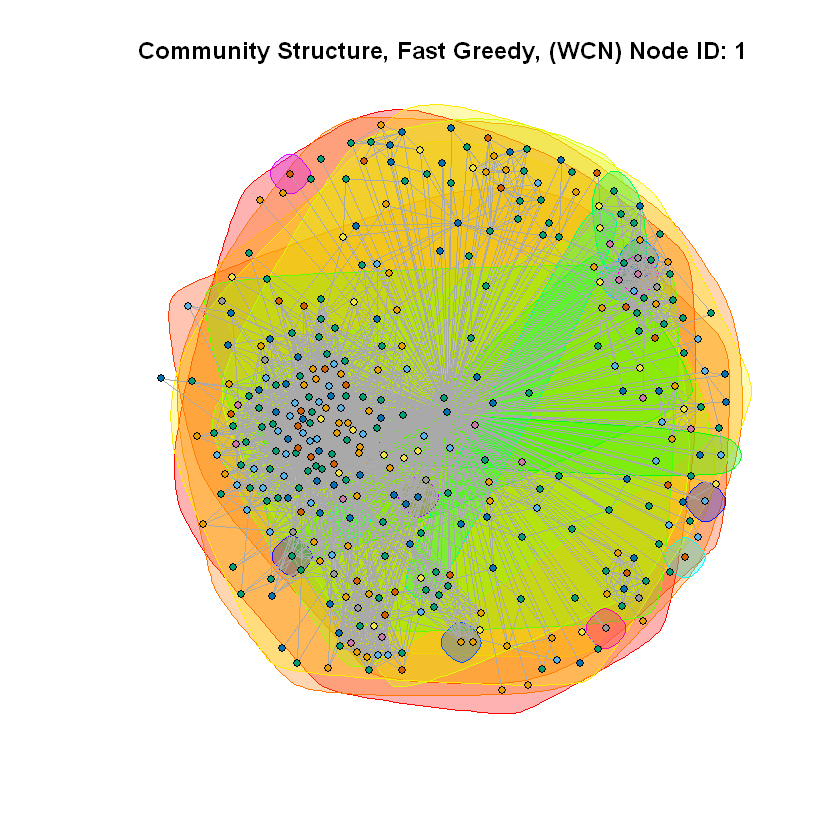

png 
  2

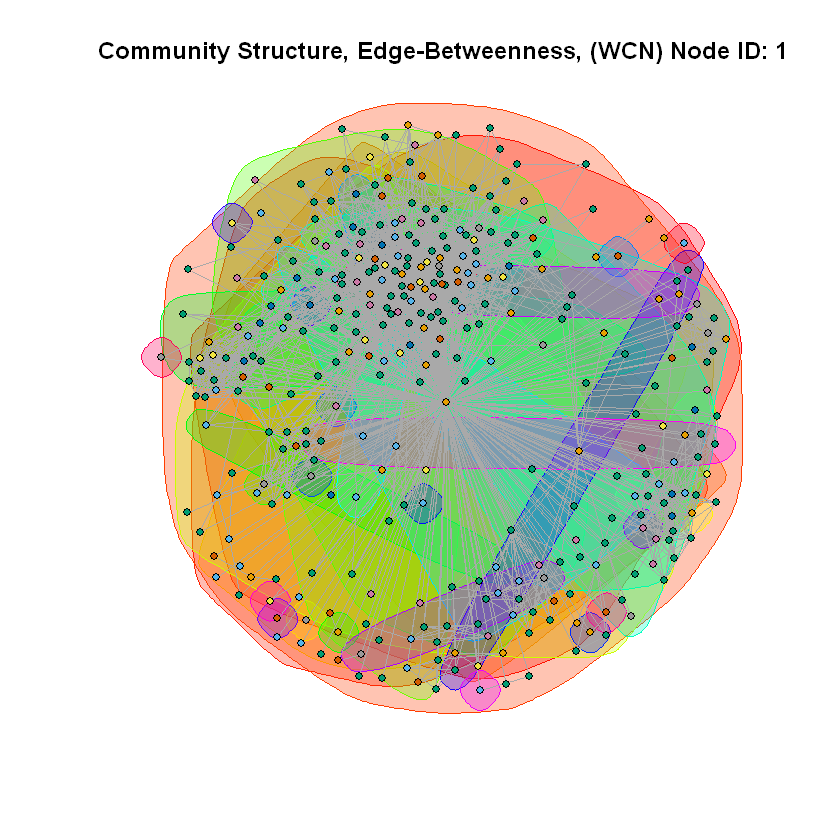

png 
  2

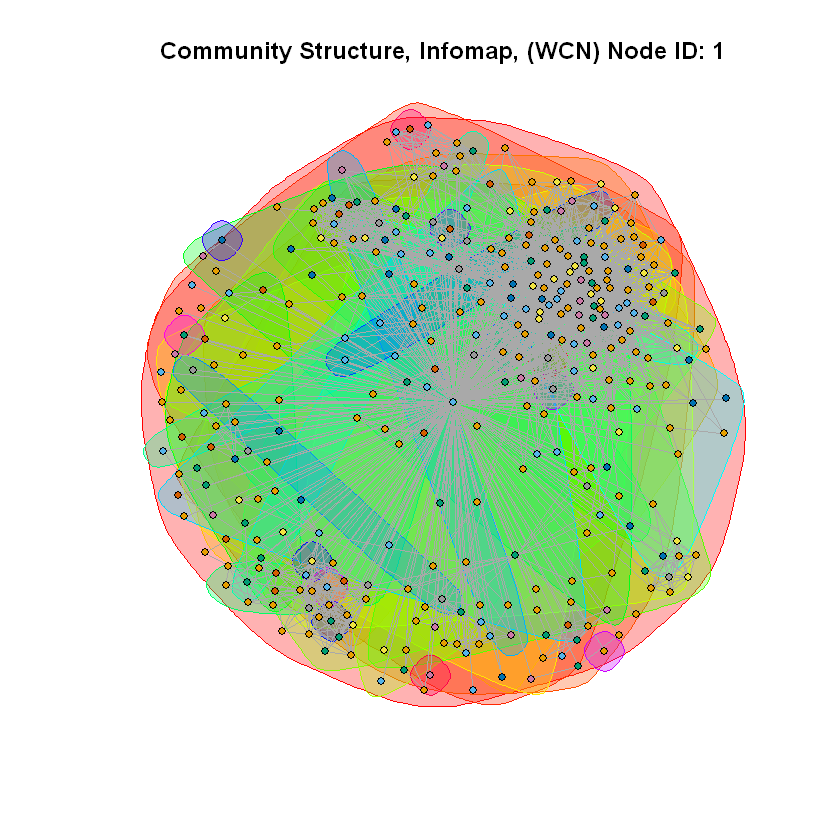

In [ ]:
i = 1
net <- induced_subgraph(g, neighbors(g, node_list[i]))
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID (without core node): %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID (without core node): %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID (without core node): %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,edge.arrow.size=.5,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,edge.arrow.size=.5,vertex.color=eb$membership ,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,edge.arrow.size=.5,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID (without core node): 349: 0.245692"
[1] "Modularity, Edge-Betweenness, Node ID (without core node): 349: 0.150566"
[1] "Modularity, Infomap, Node ID (without core node): 349: 0.244816"


png 
  2

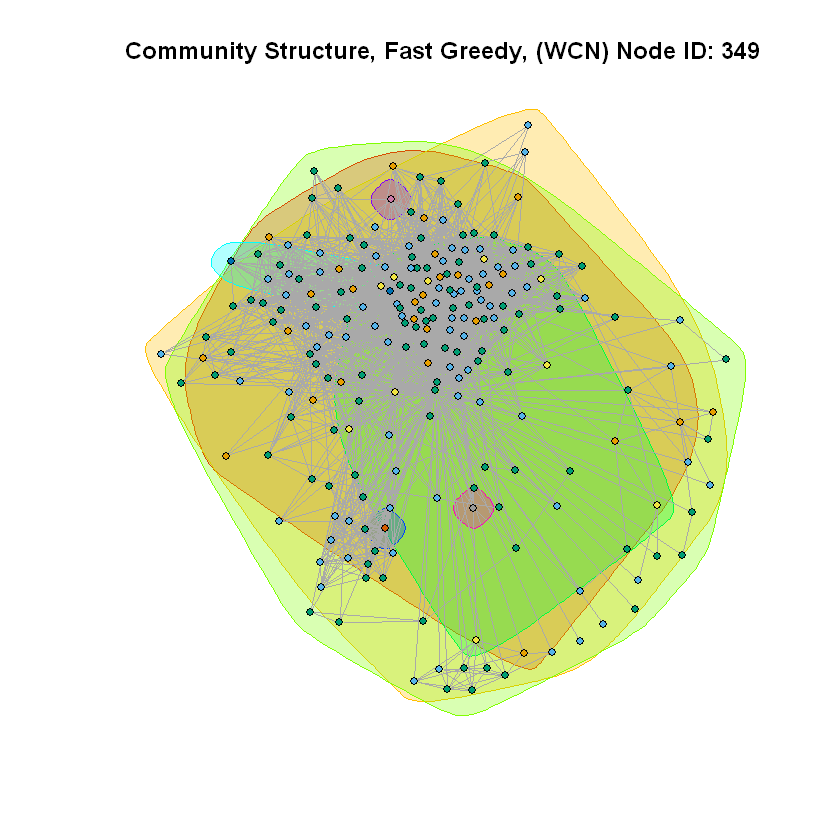

png 
  2

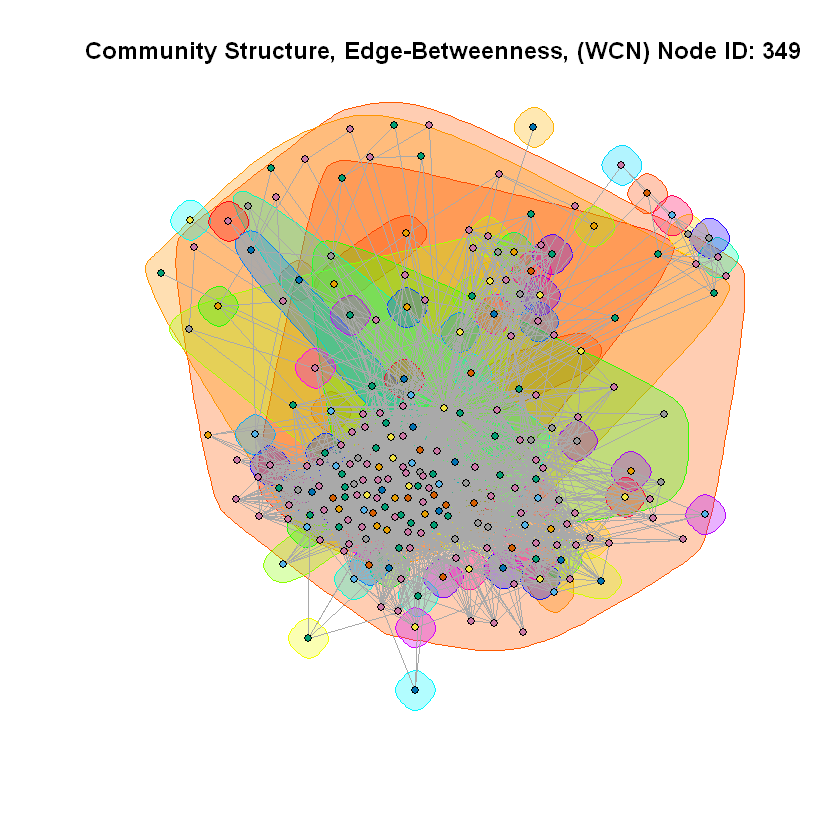

png 
  2

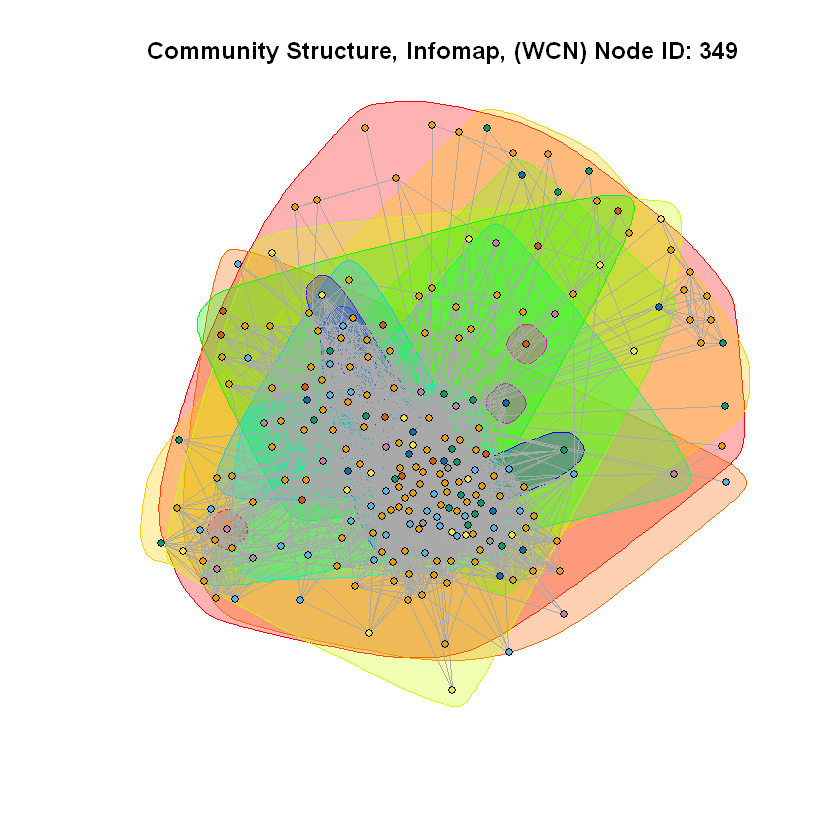

In [ ]:
i = 2
net <- induced_subgraph(g, neighbors(g, node_list[i]))
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID (without core node): %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID (without core node): %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID (without core node): %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,edge.arrow.size=.5,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,edge.arrow.size=.5,vertex.color=eb$membership ,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,edge.arrow.size=.5,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID (without core node): 484: 0.534214"
[1] "Modularity, Edge-Betweenness, Node ID (without core node): 484: 0.515441"
[1] "Modularity, Infomap, Node ID (without core node): 484: 0.543444"


png 
  2

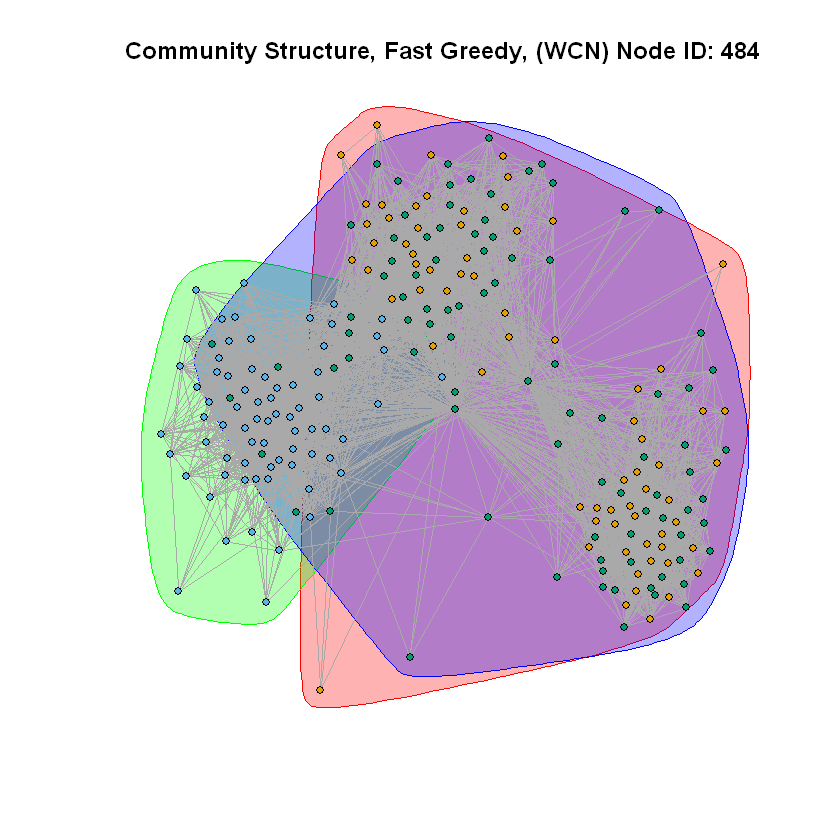

png 
  2

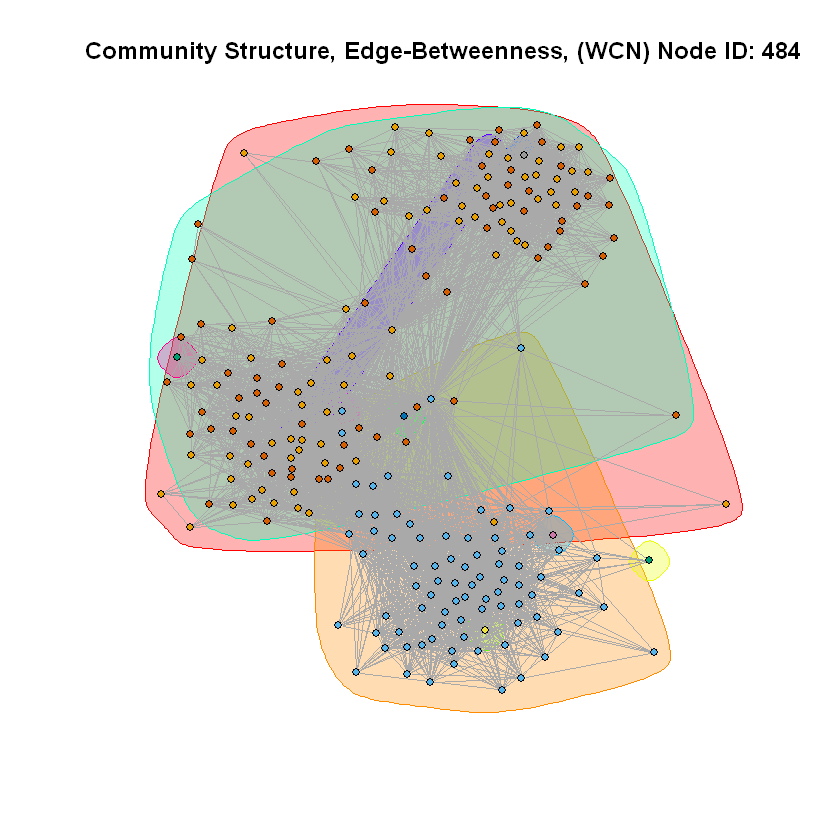

png 
  2

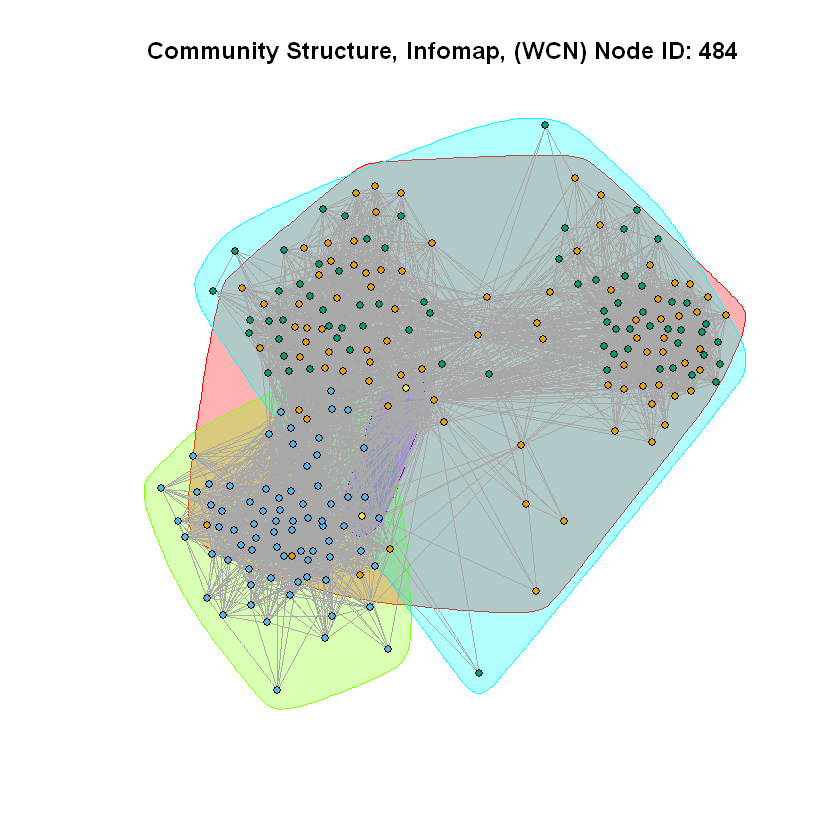

In [ ]:
i = 3
net <- induced_subgraph(g, neighbors(g, node_list[i]))
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID (without core node): %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID (without core node): %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID (without core node): %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,edge.arrow.size=.5,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,edge.arrow.size=.5,vertex.color=eb$membership ,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,edge.arrow.size=.5,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID (without core node): 1087: 0.148196"
[1] "Modularity, Edge-Betweenness, Node ID (without core node): 1087: 0.032495"
[1] "Modularity, Infomap, Node ID (without core node): 1087: 0.027372"


png 
  2

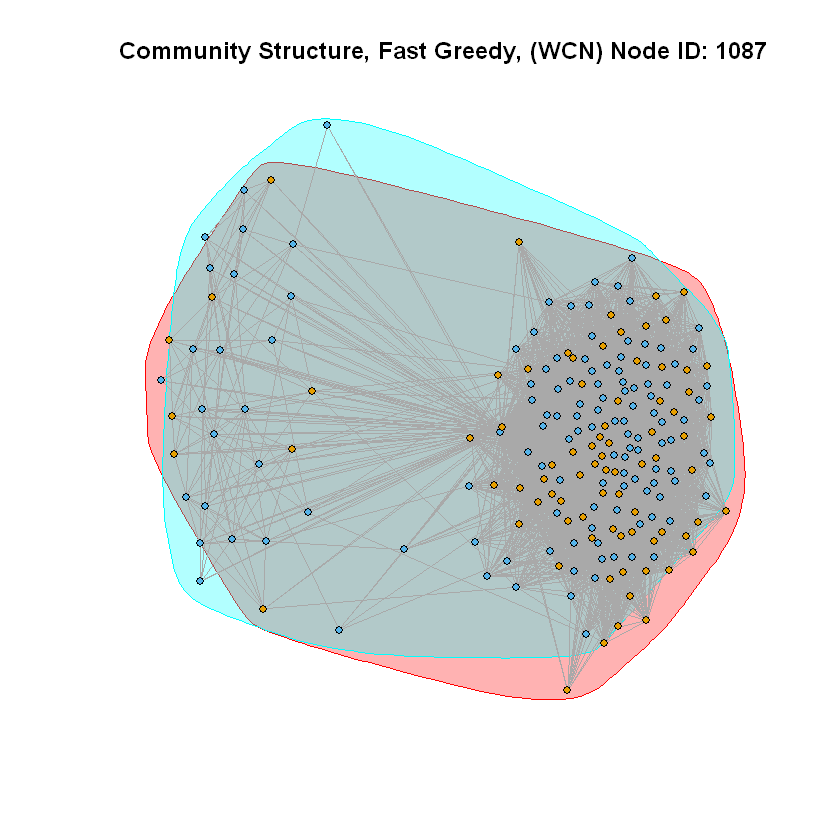

png 
  2

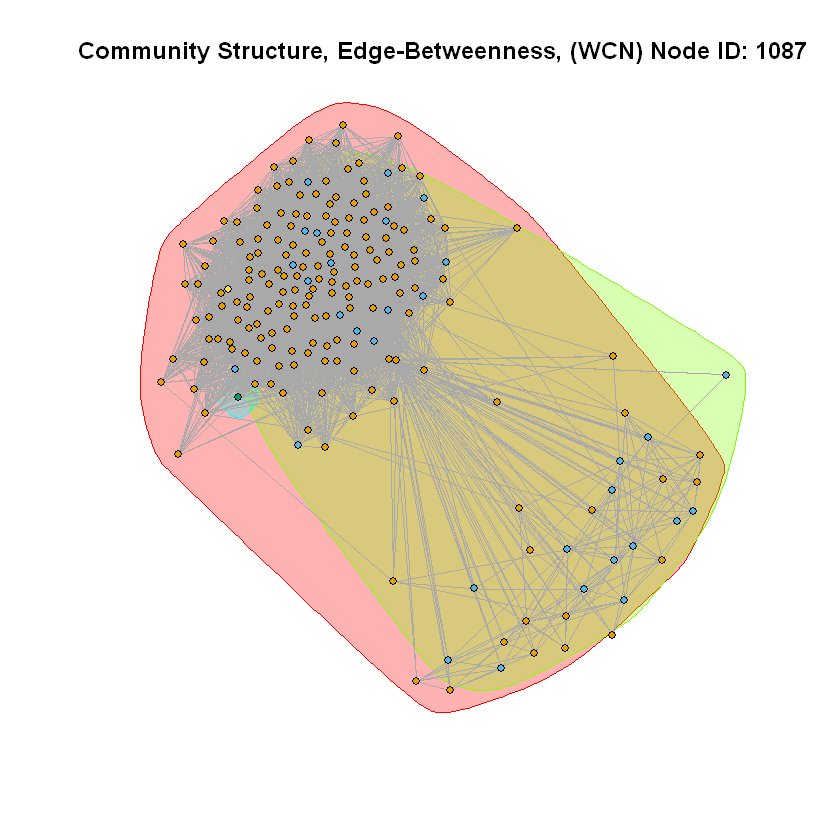

png 
  2

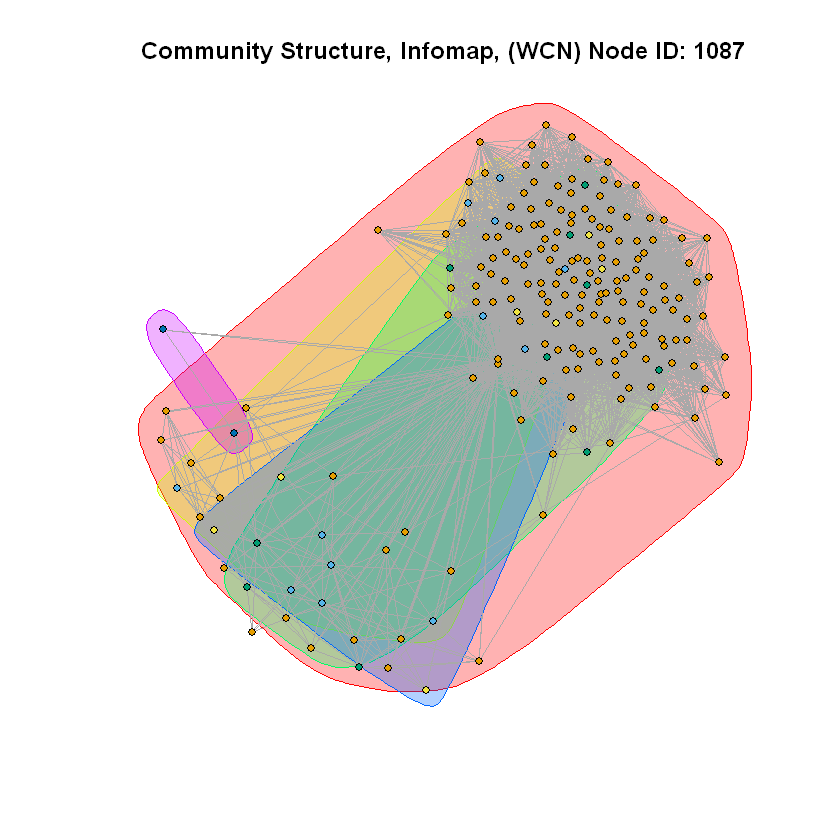

In [ ]:
i = 4
net <- induced_subgraph(g, neighbors(g, node_list[i]))
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID (without core node): %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID (without core node): %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID (without core node): %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,edge.arrow.size=.5,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,edge.arrow.size=.5,vertex.color=eb$membership ,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,edge.arrow.size=.5,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10imc%d.pdf',node_list[i]))

[1] "Modularity, Fast Greedy, Node ID (without core node): 108: 0.458127"
[1] "Modularity, Edge-Betweenness, Node ID (without core node): 108: 0.521322"
[1] "Modularity, Infomap, Node ID (without core node): 108: 0.520683"


pdf 
  2

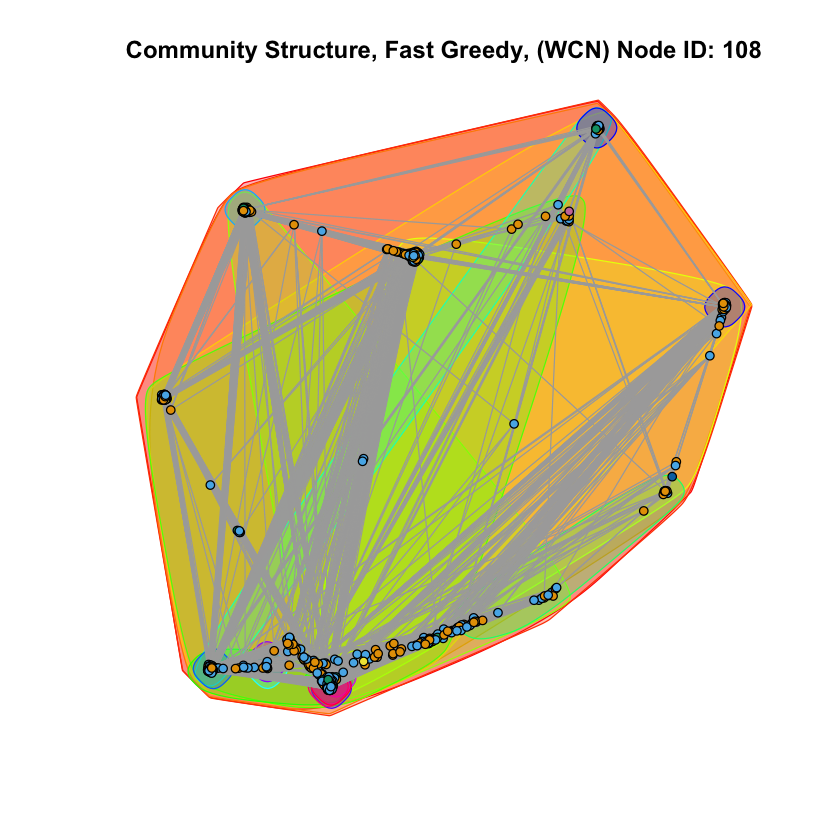

pdf 
  2

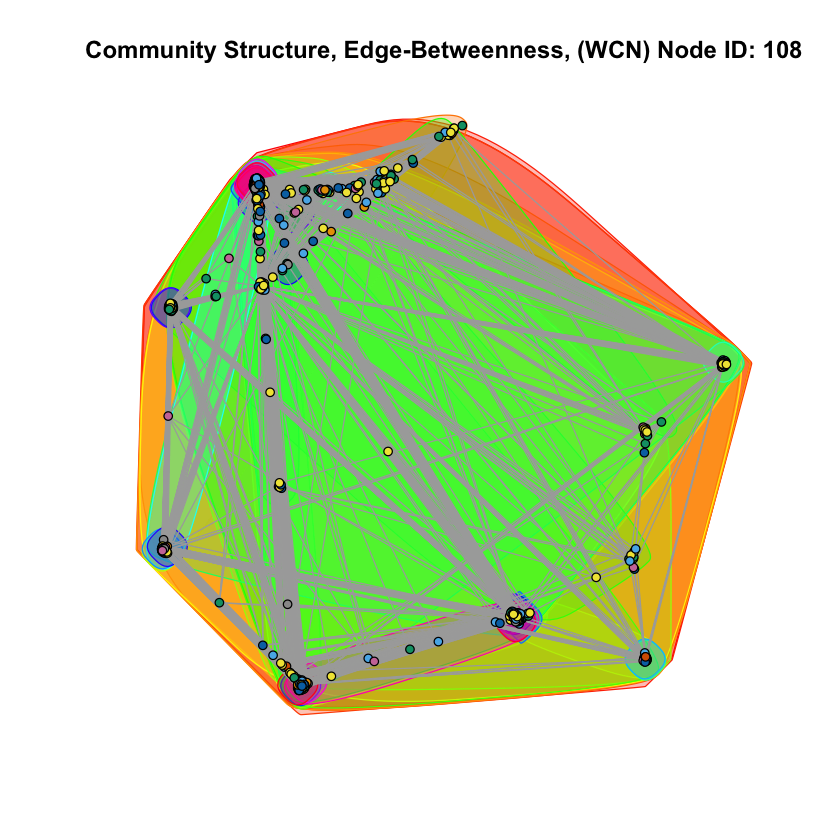

Warning message in grDevices::dev.copy(file = sprintf("Q10imc%d.eps", node_list[i]), :
“semi-transparency is not supported on this device: reported only once per page”

pdf 
  2

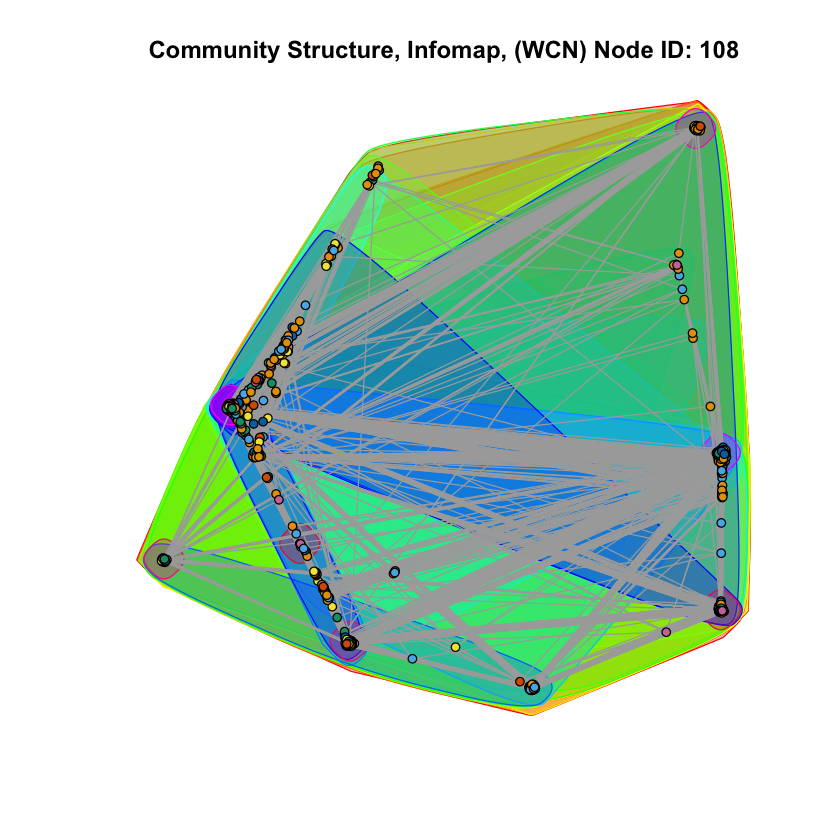

In [ ]:
i = 5
net <- induced_subgraph(g, neighbors(g, node_list[i]))
fc <- cluster_fast_greedy(net)
eb <- cluster_edge_betweenness(net)
imc <- cluster_infomap(net)
print(sprintf("Modularity, Fast Greedy, Node ID (without core node): %d: %f",node_list[i], modularity(fc)))
print(sprintf("Modularity, Edge-Betweenness, Node ID (without core node): %d: %f",node_list[i], modularity(eb)))
print(sprintf("Modularity, Infomap, Node ID (without core node): %d: %f",node_list[i], modularity(imc)))
plot(eg[[i]],mark.groups = fc,vertex.size=3,edge.arrow.size=.5,vertex.color=fc$membership,vertex.label="",main = sprintf("Community Structure, Fast Greedy, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdaf(file=sprintf('Q10fc%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = eb,vertex.size=3,edge.arrow.size=.5,vertex.color=eb$membership ,vertex.label="",main = sprintf("Community Structure, Edge-Betweenness, (WCN) Node ID: %d", node_list[i]))
dev.copy2pdf(file=sprintf('Q10eb%d.pdf',node_list[i]))
plot(eg[[i]],mark.groups = imc,vertex.size=3,edge.arrow.size=.5,vertex.color=imc$membership,vertex.label="",main = sprintf("Community Structure, Infomap, (WCN) Node ID: %d", node_list[i]))
dev.copy2eps(file=sprintf('Q10imc%d.eps',node_list[i]))

In [ ]:
library(igraph)


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union



In [ ]:
el <- read.table("facebook_combined.txt")
g <- graph.data.frame(el, directed=FALSE)


# Question 12

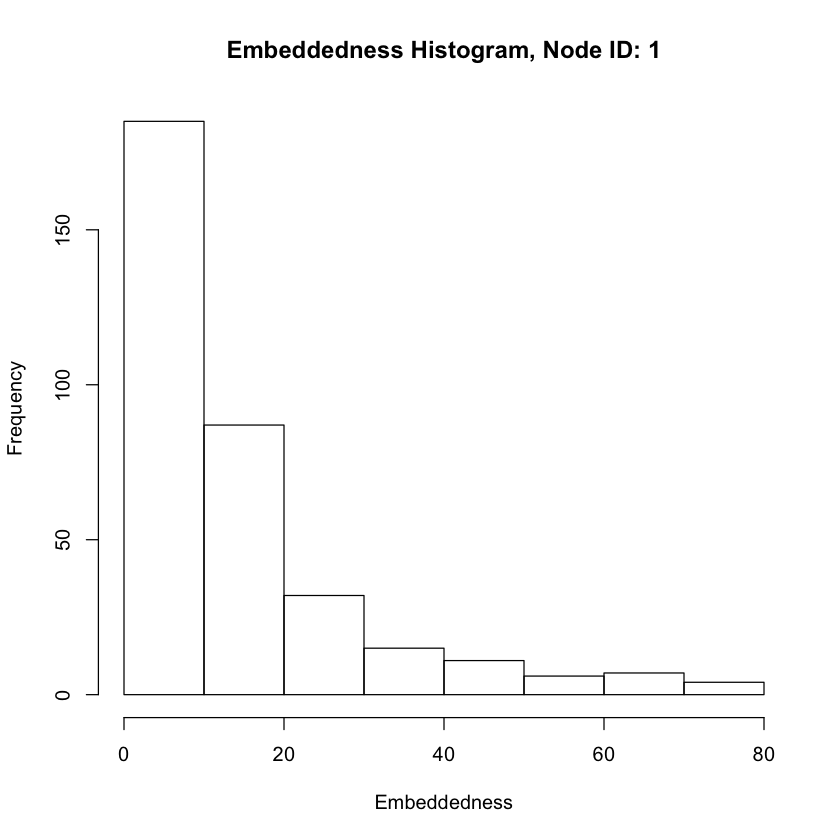

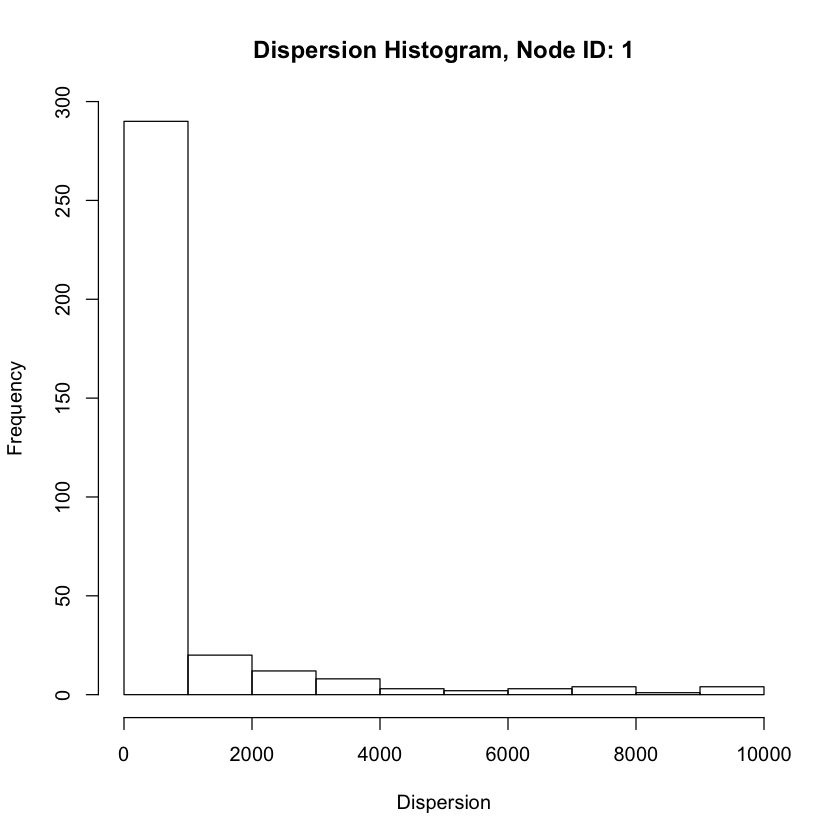

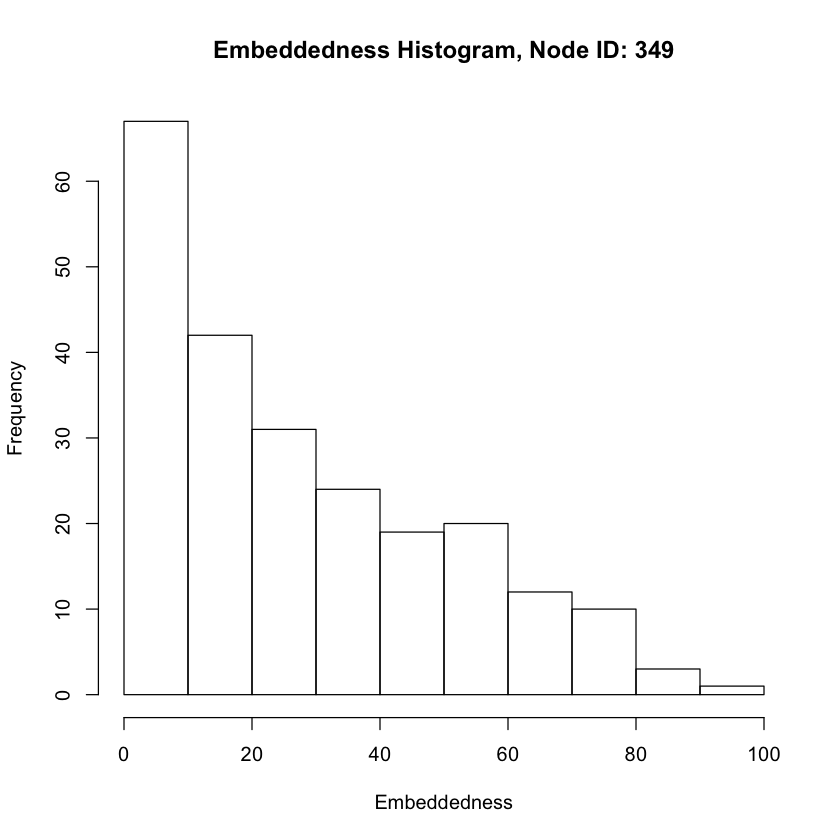

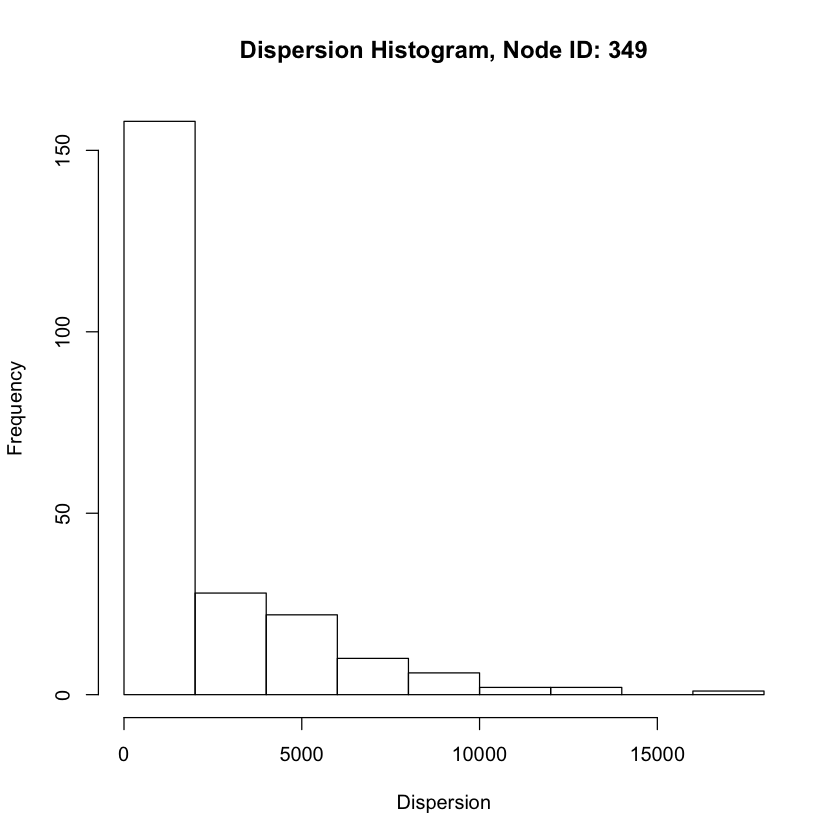

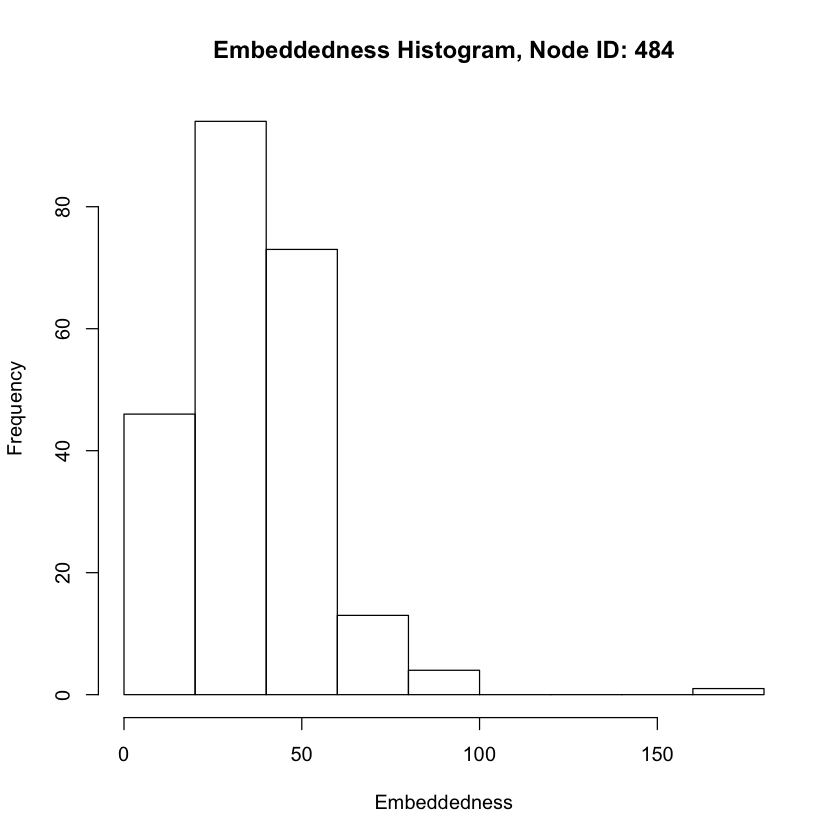

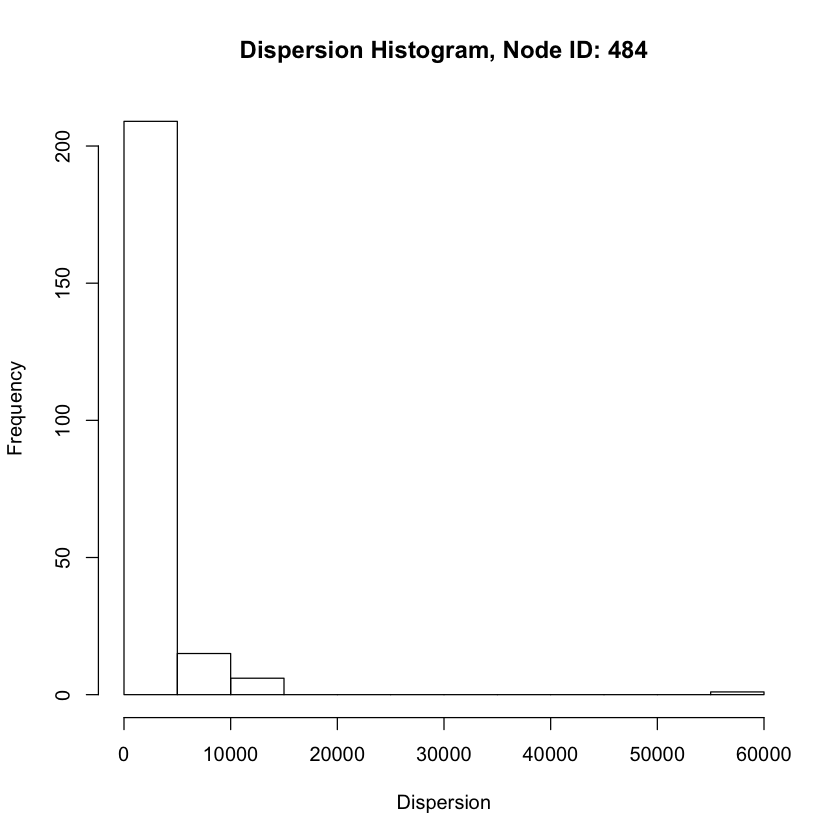

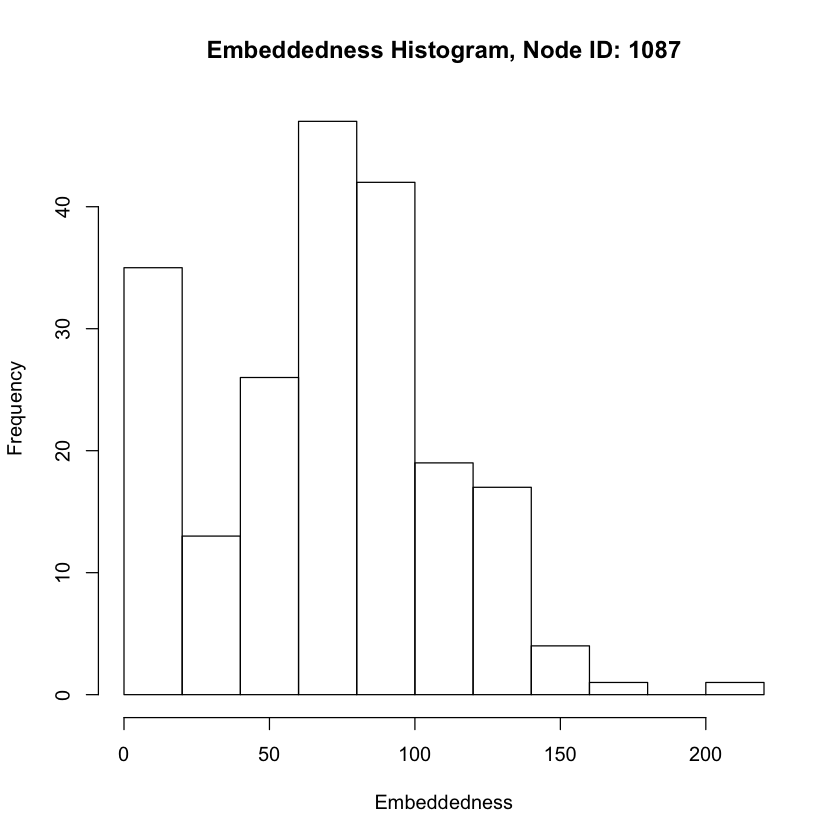

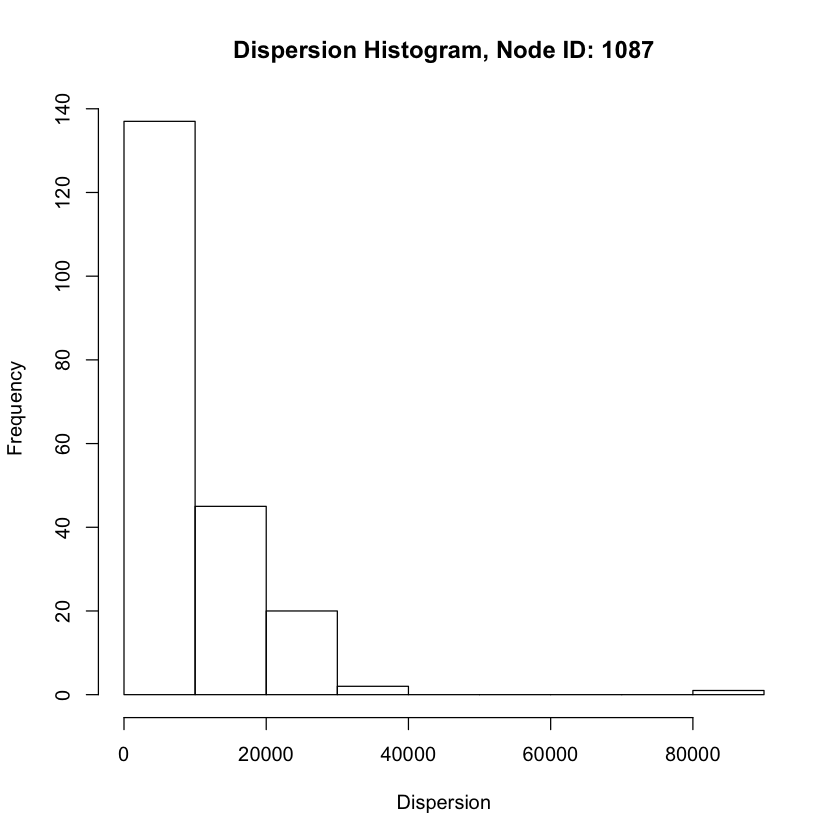

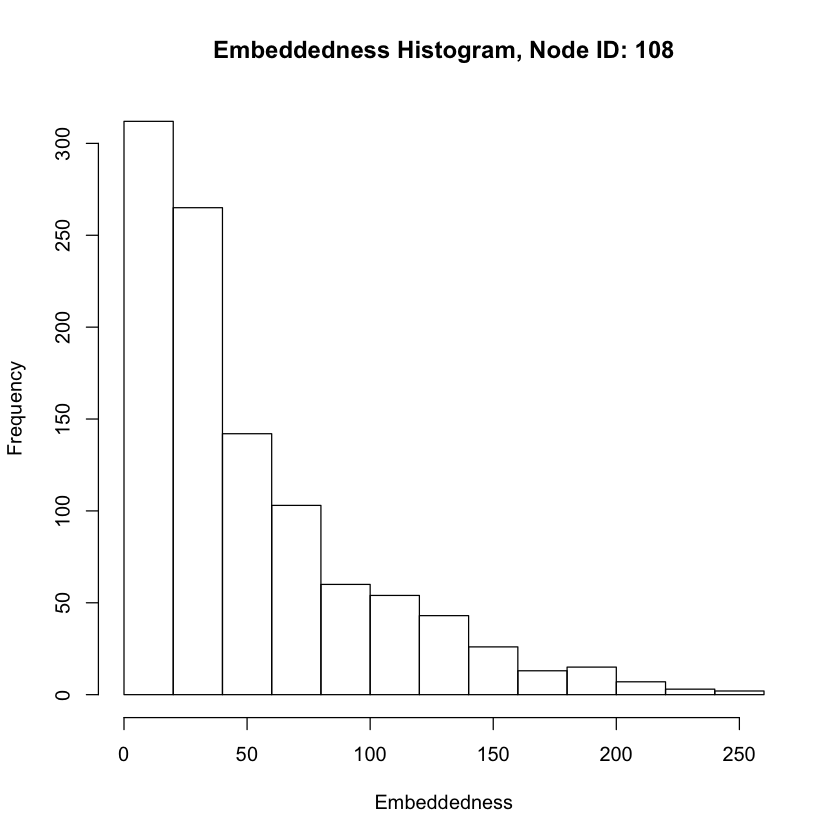

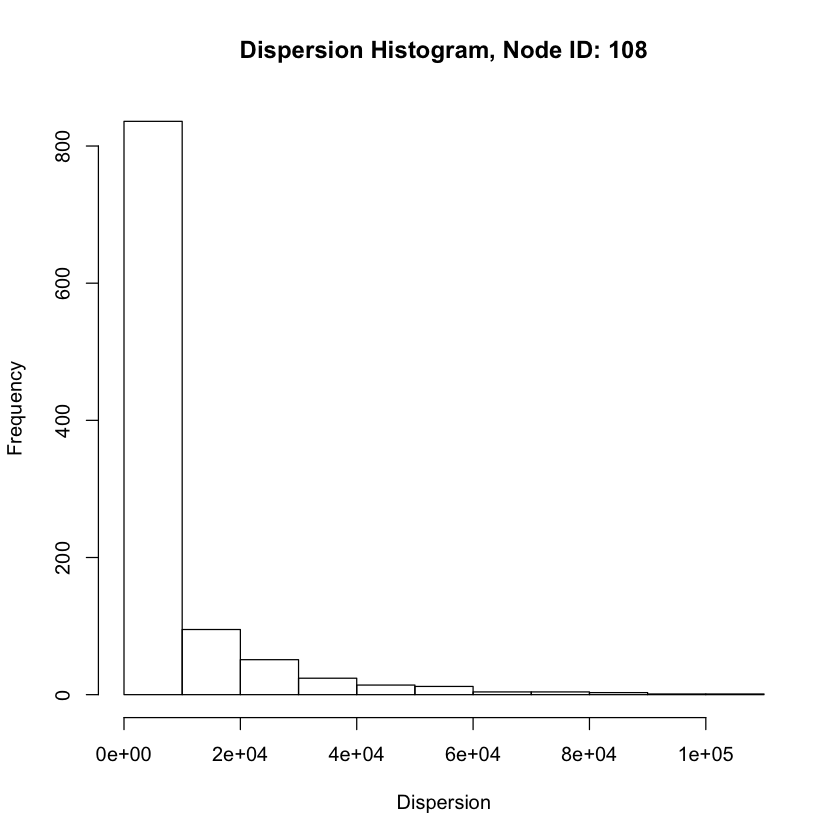

In [ ]:
el <- read.table("facebook_combined.txt",header=FALSE)
fb <- graph.data.frame(el, directed=FALSE)
node_list_str = c("0","348","483","1086","107")
for(j in c(1:5)){
    
    nodelist = unlist(ego(fb, order=1, nodes=node_list_str[j]))
    pn = induced.subgraph(fb,nodelist)
    pn$name = sort(nodelist)
    embeddedness <- c()
    disp <- c()
    deg <- c()
    i=1
    for(v in vertex_attr(pn)$name){ 
        if(v==node_list_str[j])
            next
            
        disp[i] = 0
        neh_ver = neighbors(pn, node_list_str[j])
        neh_core = neighbors(pn,v)
        inter = intersection(neh_ver, neh_core)
        embeddedness[i] = length(inter)
        
        deg[i] = degree(pn,v)
        eg2 = delete.vertices(pn, c(node_list_str[j], v))
        if(embeddedness[i]>1){
            ver = c()
            for(m in 1:length(inter)){
                ver =  c(ver,vertex_attr(pn)$name[inter[m]])
            }
            ver1=c()
            for(m in 1:length(ver)){
                ver1=c(ver1,which(vertex_attr(eg2)$name==ver[m]))
            }
            disp_mat = distances(eg2,v=ver1, to=ver1)
            disp_mat[disp_mat==Inf]<-diameter(eg2)+1
            disp[i] = sum(disp_mat)
        }
        i=i+1
        
    } 
    hist(embeddedness,main=sprintf("Embeddedness Histogram, Node ID: %d",strtoi(node_list_str[j])+1), xlab="Embeddedness",ylab="Frequency")
    dev.copy2eps(file=sprintf('Q12e_%d.eps',j+1))
    hist(disp,main=sprintf("Dispersion Histogram, Node ID: %d",strtoi(node_list_str[j])+1), xlab="Dispersion",ylab="Frequency")
    dev.copy2eps(file=sprintf('Q12d_%d.eps',j+1))
}

# Question 13

Warning message in grDevices::dev.copy(file = sprintf("Q13_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”Warning message in grDevices::dev.copy(file = sprintf("Q13_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

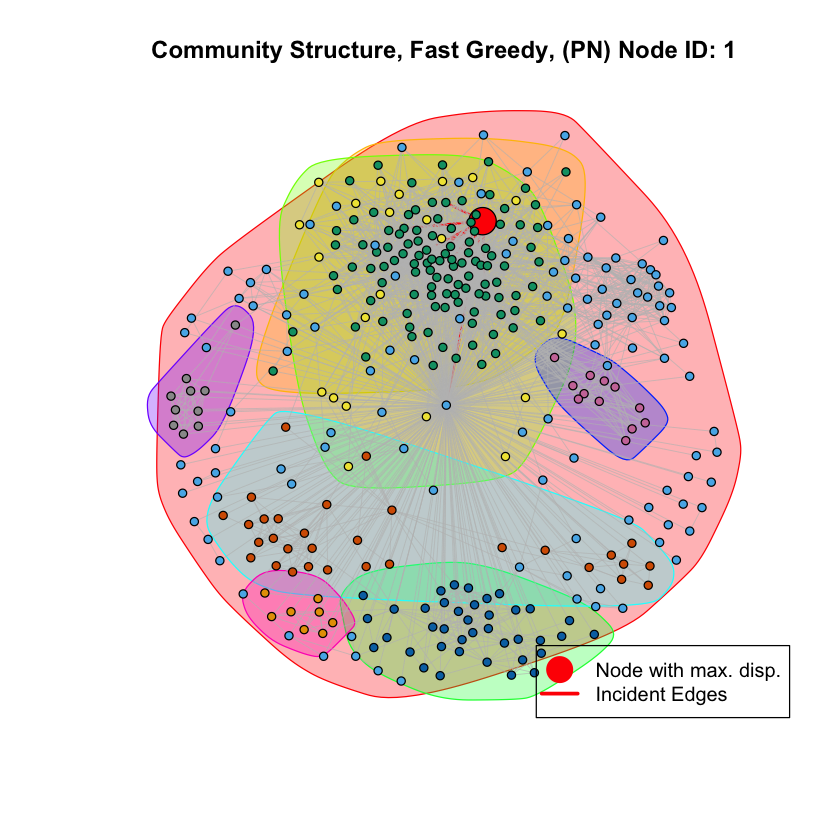

Warning message in grDevices::dev.copy(file = sprintf("Q13_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

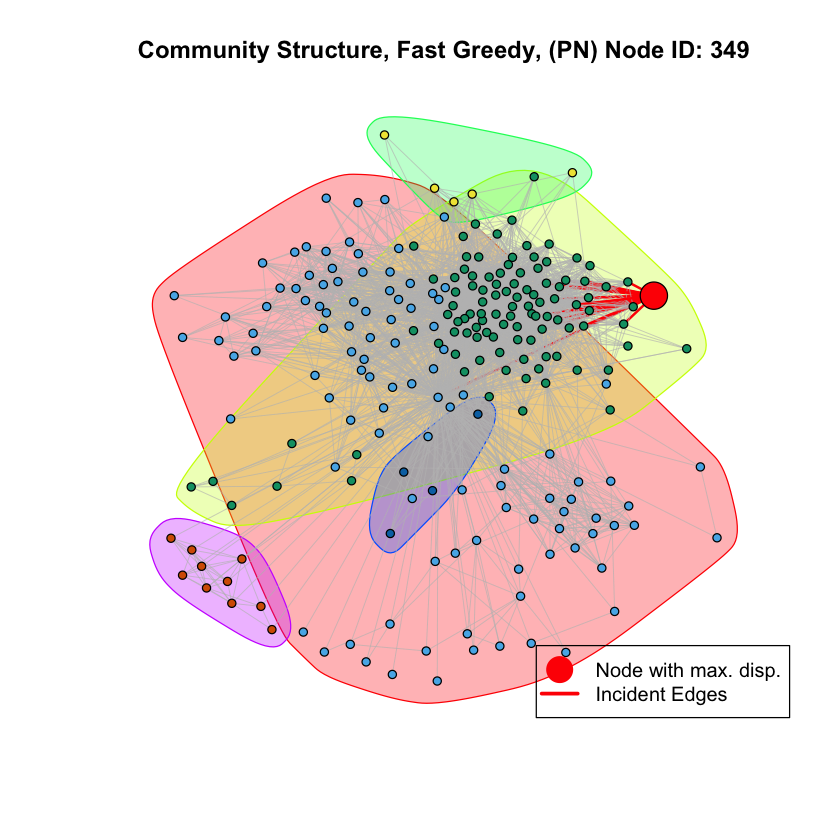

Warning message in grDevices::dev.copy(file = sprintf("Q13_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

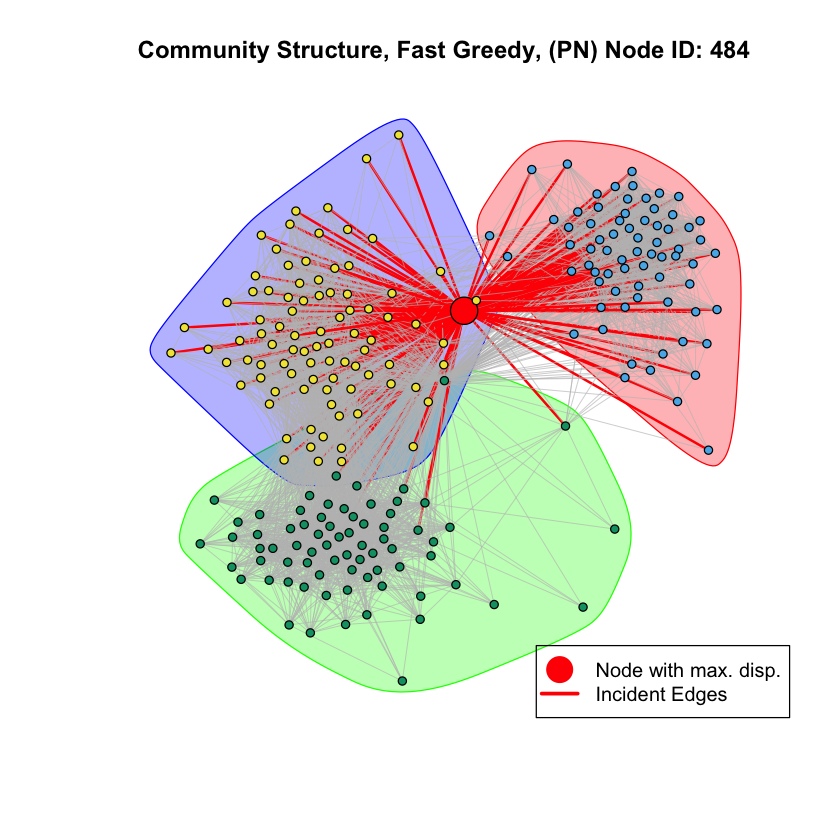

Warning message in grDevices::dev.copy(file = sprintf("Q13_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

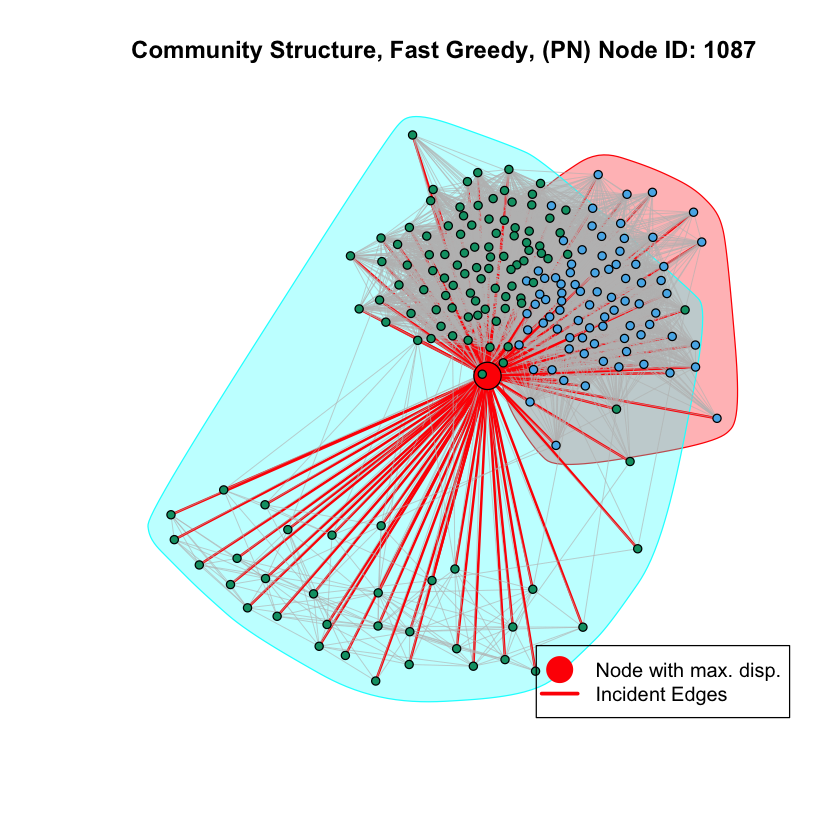

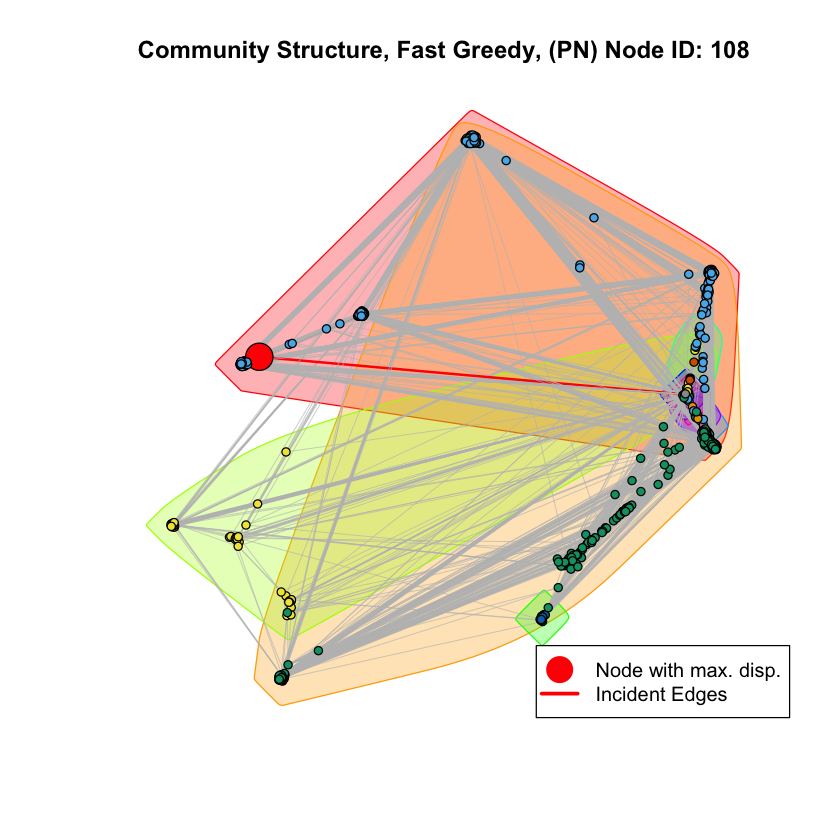

In [ ]:
el <- read.table("facebook_combined.txt",header=FALSE)
fb <- graph.data.frame(el, directed=FALSE)
node_list_str = c("0","348","483","1086","107")
for(j in c(1:5)){
    
    nodelist = unlist(ego(fb, order=1, nodes=node_list_str[j]))
    pn = induced.subgraph(fb,nodelist)
    pn$name = sort(nodelist)
    embeddedness <- c()
    disp <- c()
    deg <- c()
    i=1
    for(v in vertex_attr(pn)$name){ 
        if(v==node_list_str[j])
            next
            
        disp[i] = 0
        neh_ver = neighbors(pn, node_list_str[j])
        neh_core = neighbors(pn,v)
        inter = intersection(neh_ver, neh_core)
        embeddedness[i] = length(inter)
        
        deg[i] = degree(pn,v)
        eg2 = delete.vertices(pn, c(node_list_str[j], v))
        if(embeddedness[i]>1){
            ver = c()
            for(m in 1:length(inter)){
                ver =  c(ver,vertex_attr(pn)$name[inter[m]])
            }
            ver1=c()
            for(m in 1:length(ver)){
                ver1=c(ver1,which(vertex_attr(eg2)$name==ver[m]))
            }
            disp_mat = distances(eg2,v=ver1, to=ver1)
            disp_mat[disp_mat==Inf]<-diameter(eg2)+1
            disp[i] = sum(disp_mat)
        }
        i=i+1
        
    } 
    
    maxdisp = pn$name[which(disp==max(disp))]
    maxnode = which(pn$name==maxdisp)
    
    fc <- cluster_fast_greedy(pn)
    vert_col = fc$membership+1
    vert_col[maxnode] = "red"
    vert_size = rep(3, length(vert_col))
    vert_size[maxnode] = 10
    edge_col = rep("grey", length(E(pn)))
    edge_col[which(get.edgelist(pn, name = FALSE)[,1] == maxnode | get.edgelist(pn, name = FALSE)[,2] == maxnode)] = "red"
    edge_wid = rep(0.5,length(E(pn)))
    edge_wid[which(get.edgelist(pn, name = FALSE)[,1] == maxnode |  get.edgelist(pn, name = FALSE)[,2] == maxnode)] = 2;
    plot(pn,mark.groups = fc,vertex.size=vert_size,edge.arrow.size=.5,vertex.color=vert_col,edge.color = edge_col,edge.width=edge_wid,
         vertex.label="",main = sprintf("Community Structure, Fast Greedy, (PN) Node ID: %d", strtoi(node_list_str[j])+1))
    legend('bottomright', legend = c("Node with max. disp.", "Incident Edges"),
       lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),
       col = c('red','red'), pt.cex=3)
    dev.copy2eps(file=sprintf('Q13_%d.eps',j+1))
    
}

# Question 14

[1] "ID of node with max. emb. for core node with ID 1: 49"


Warning message in grDevices::dev.copy(file = sprintf("Q14_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

[1] "ID of node with max. emb. for core node with ID 349: 31"


Warning message in grDevices::dev.copy(file = sprintf("Q14_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

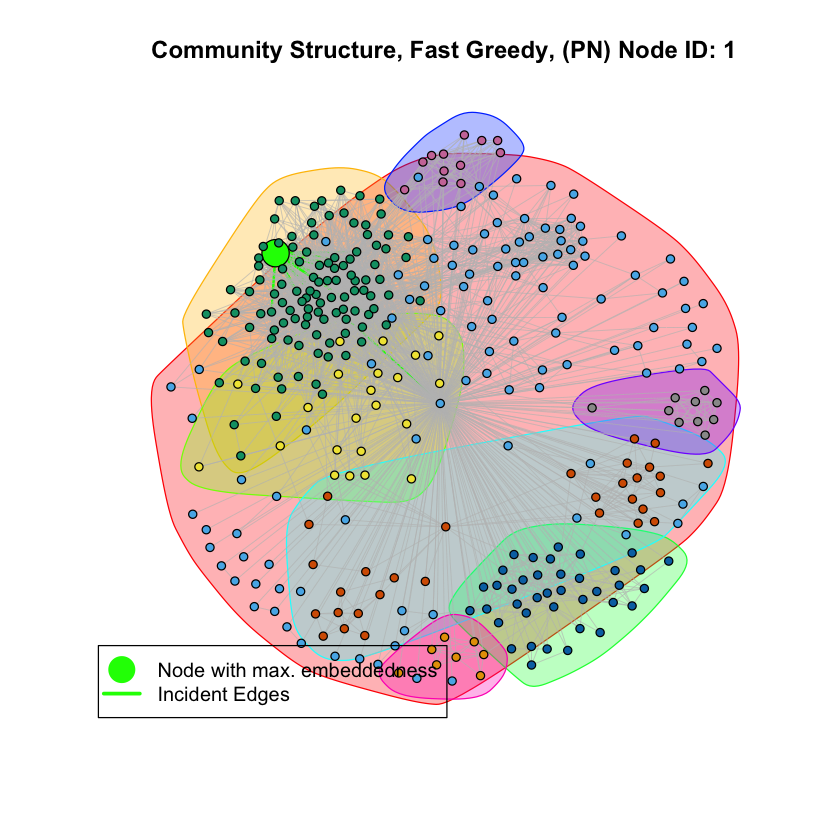

[1] "ID of node with max. emb. for core node with ID 484: 1"


Warning message in grDevices::dev.copy(file = sprintf("Q14_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

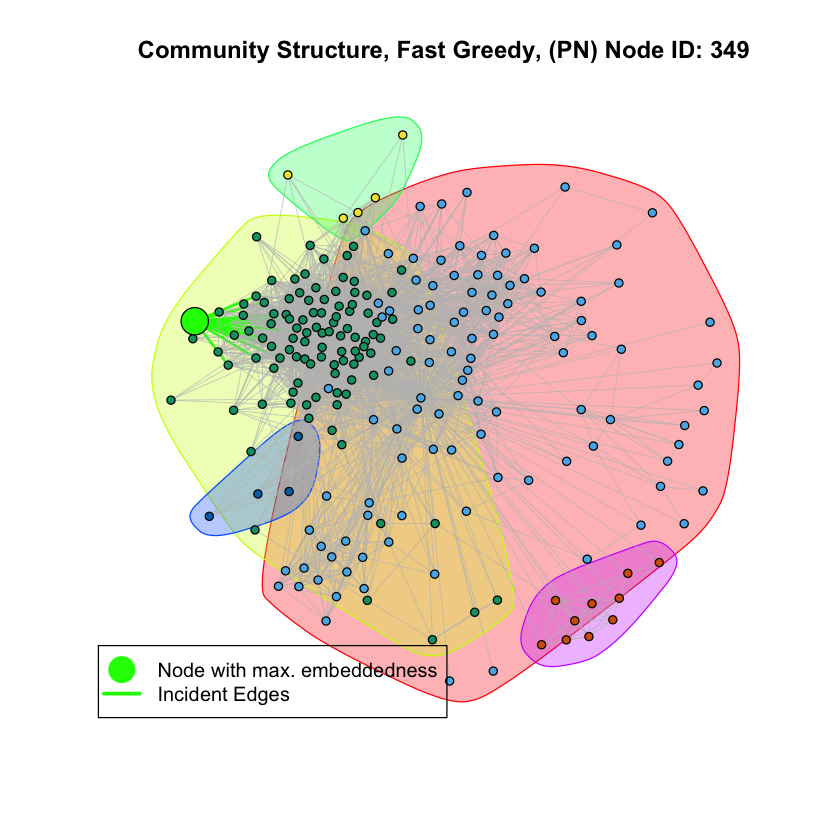

[1] "ID of node with max. emb. for core node with ID 1087: 1"


Warning message in grDevices::dev.copy(file = sprintf("Q14_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

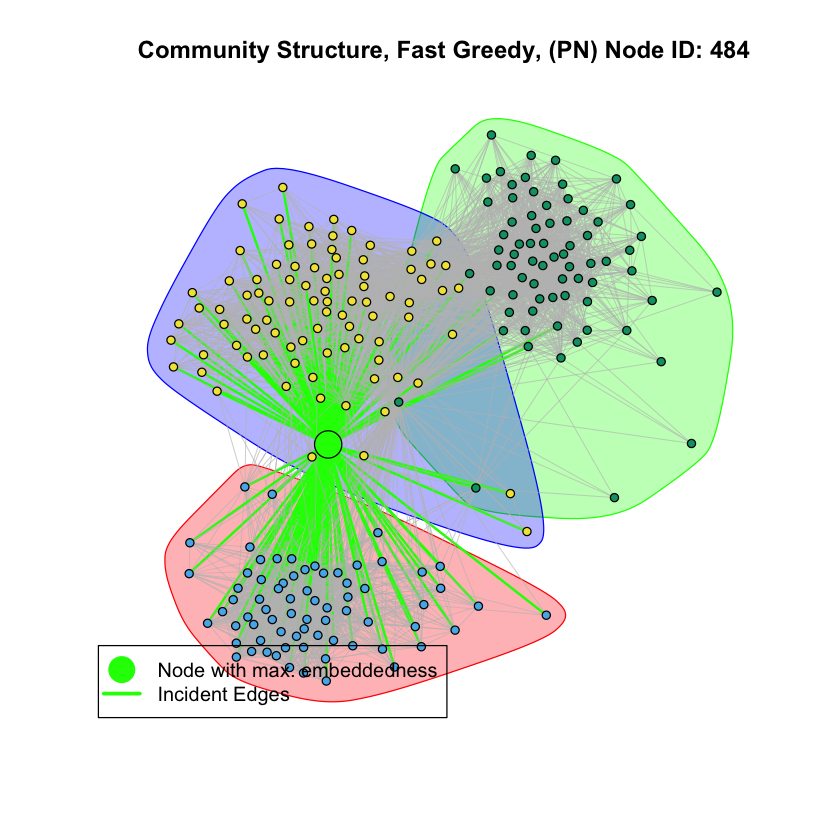

[1] "ID of node with max. emb. for core node with ID 108: 977"


Warning message in grDevices::dev.copy(file = sprintf("Q14_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

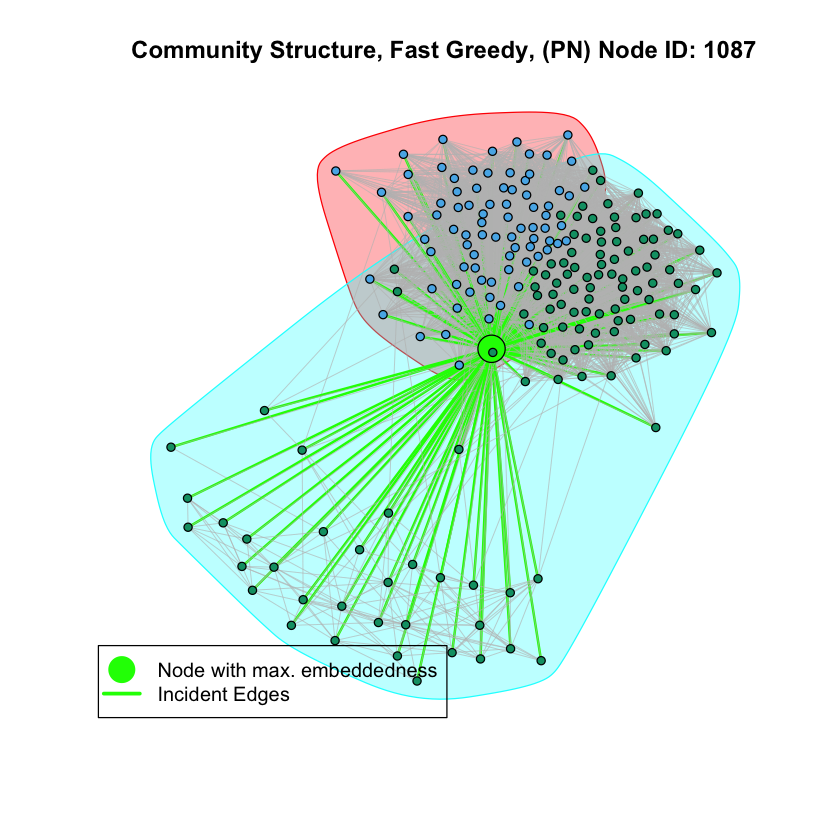

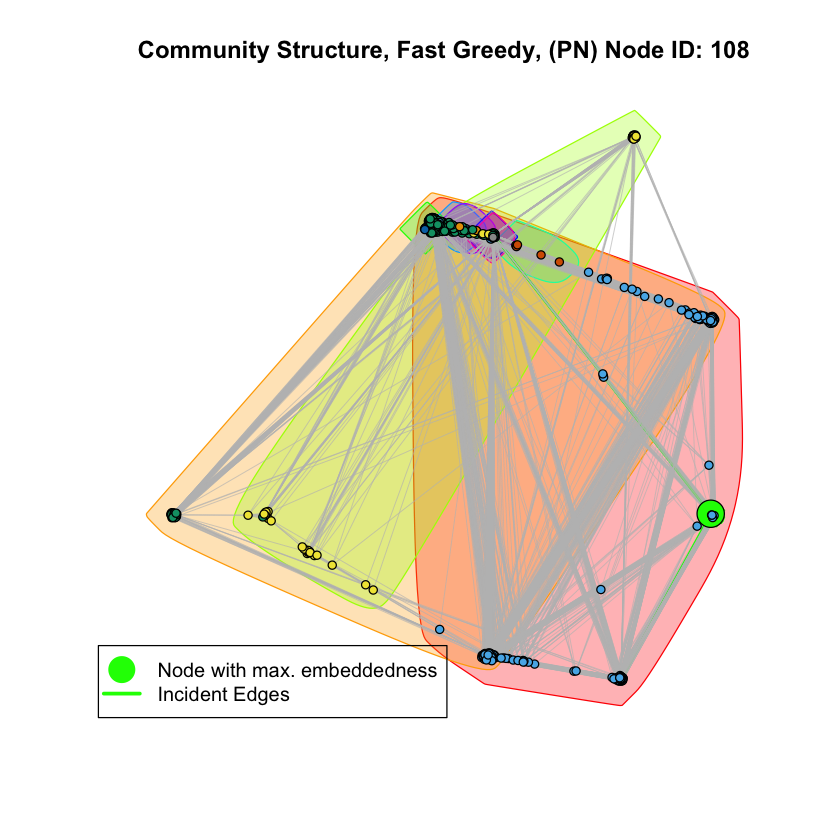

In [ ]:
el <- read.table("facebook_combined.txt",header=FALSE)
fb <- graph.data.frame(el, directed=FALSE)
node_list_str = c("0","348","483","1086","107")
for(j in c(1:5)){
    
    nodelist = unlist(ego(fb, order=1, nodes=node_list_str[j]))
    pn = induced.subgraph(fb,nodelist)
    pn$name = sort(nodelist)
    embeddedness <- c()
    disp <- c()
    deg <- c()
    i=1
    for(v in vertex_attr(pn)$name){ 
        if(v==node_list_str[j])
            next
            
        disp[i] = 0
        neh_ver = neighbors(pn, node_list_str[j])
        neh_core = neighbors(pn,v)
        inter = intersection(neh_ver, neh_core)
        embeddedness[i] = length(inter)
        
        deg[i] = degree(pn,v)
        eg2 = delete.vertices(pn, c(node_list_str[j], v))
        if(embeddedness[i]>1){
            ver = c()
            for(m in 1:length(inter)){
                ver =  c(ver,vertex_attr(pn)$name[inter[m]])
            }
            ver1=c()
            for(m in 1:length(ver)){
                ver1=c(ver1,which(vertex_attr(eg2)$name==ver[m]))
            }
            disp_mat = distances(eg2,v=ver1, to=ver1)
            disp_mat[disp_mat==Inf]<-diameter(eg2)+1
            disp[i] = sum(disp_mat)
        }
        i=i+1
        
    } 
    
    maxemb = pn$name[which(embeddedness==max(embeddedness))]
    maxnode = which(pn$name==maxemb)
    print(sprintf("ID of node with max. emb. for core node with ID %d: %d",strtoi(node_list_str[j])+1,maxnode))
    
    fc <- cluster_fast_greedy(pn)
    vert_col = fc$membership+1
    vert_col[maxnode] = "green"
    vert_size = rep(3, length(vert_col))
    vert_size[maxnode] = 10
    edge_col = rep("grey", length(E(pn)))
    edge_col[which(get.edgelist(pn, name = FALSE)[,1] == maxnode | get.edgelist(pn, name = FALSE)[,2] == maxnode)] = "green"
    edge_wid = rep(0.5,length(E(pn)))
    edge_wid[which(get.edgelist(pn, name = FALSE)[,1] == maxnode |  get.edgelist(pn, name = FALSE)[,2] == maxnode)] = 2;
    plot(pn,mark.groups = fc,vertex.size=vert_size,edge.arrow.size=.5,vertex.color=vert_col,edge.color = edge_col,edge.width=edge_wid,
         vertex.label="",main = sprintf("Community Structure, Fast Greedy, (PN) Node ID: %d", strtoi(node_list_str[j])+1))
    legend('bottomleft', legend = c("Node with max. embeddedness", "Incident Edges"),
       lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),
       col = c('green','green'), pt.cex=3)
    dev.copy2eps(file=sprintf('Q14_%d.eps',j+1))
    
}

[1] "ID of node with max. ratio for core node with ID 1: 21"


Warning message in grDevices::dev.copy(file = sprintf("Q14b_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

[1] "ID of node with max. ratio for core node with ID 349: 31"


Warning message in grDevices::dev.copy(file = sprintf("Q14b_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

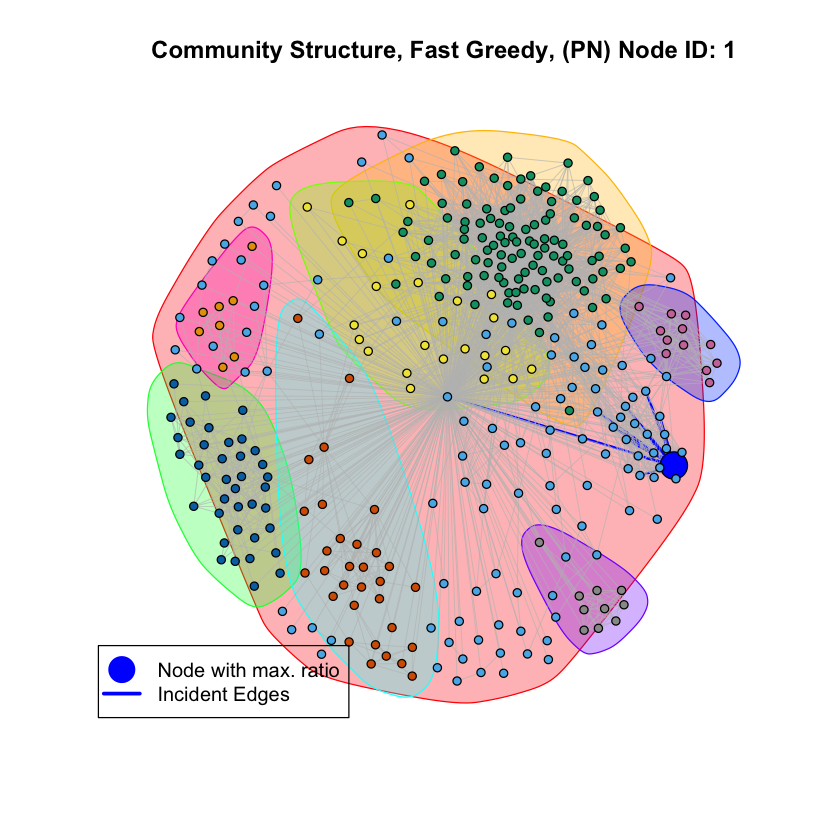

[1] "ID of node with max. ratio for core node with ID 484: 1"


Warning message in grDevices::dev.copy(file = sprintf("Q14b_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

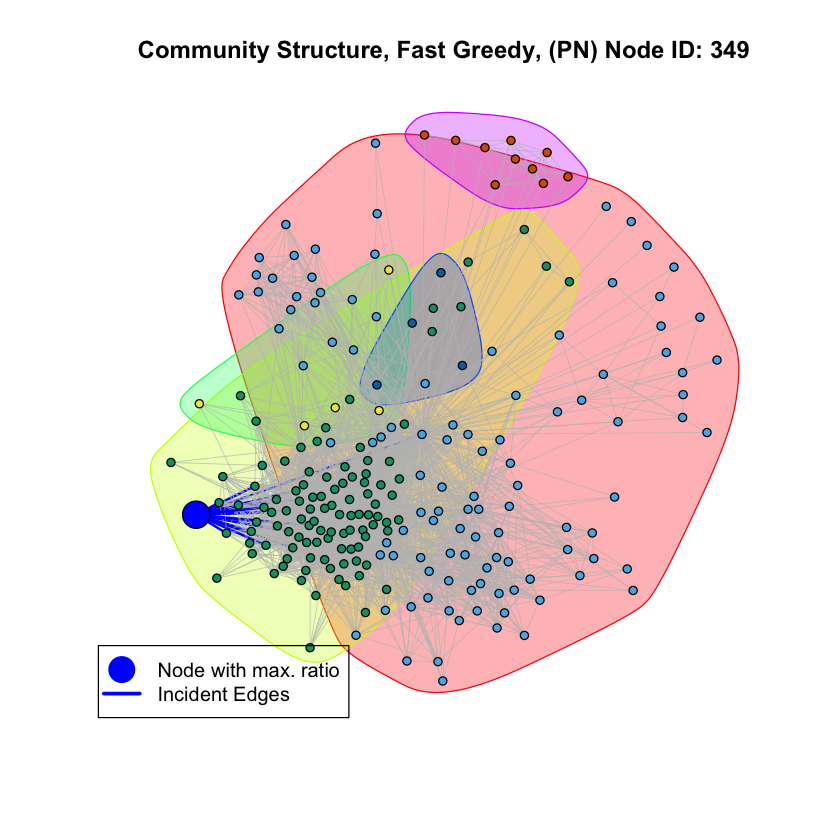

[1] "ID of node with max. ratio for core node with ID 1087: 1"


Warning message in grDevices::dev.copy(file = sprintf("Q14b_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

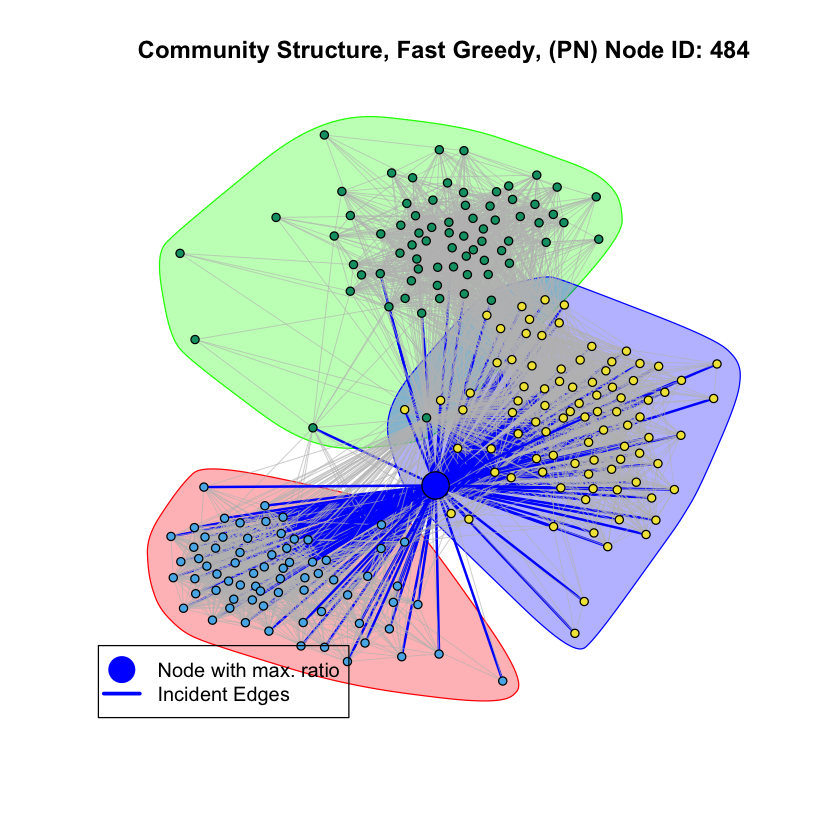

[1] "ID of node with max. ratio for core node with ID 108: 977"


Warning message in grDevices::dev.copy(file = sprintf("Q14b_%d.eps", j + 1), device = function (file = if (onefile) "Rplots.ps" else "Rplot%03d.ps", :
“semi-transparency is not supported on this device: reported only once per page”

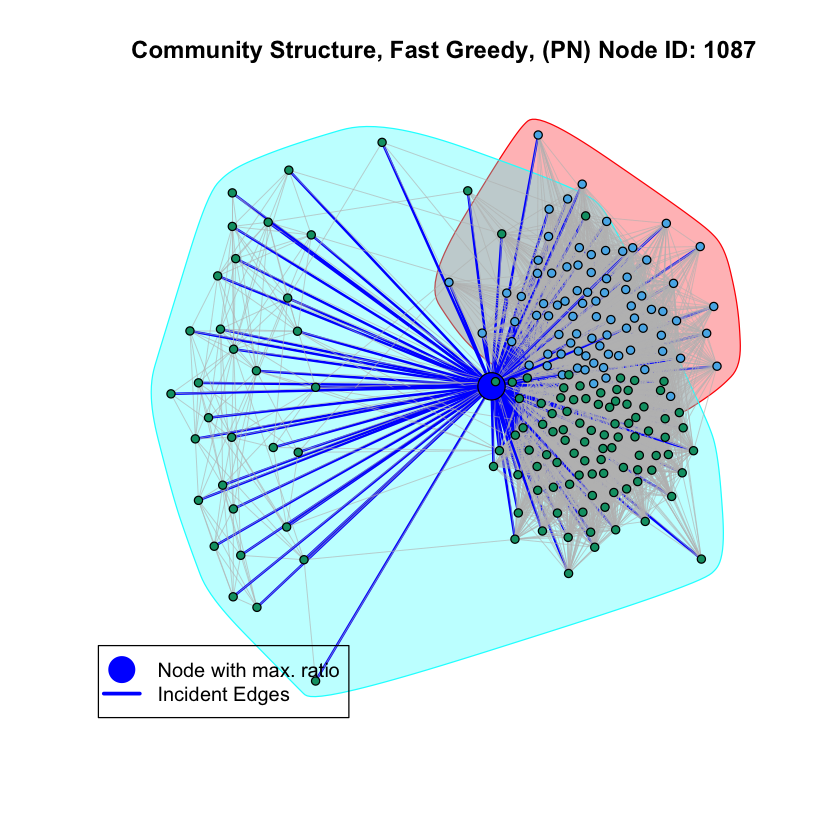

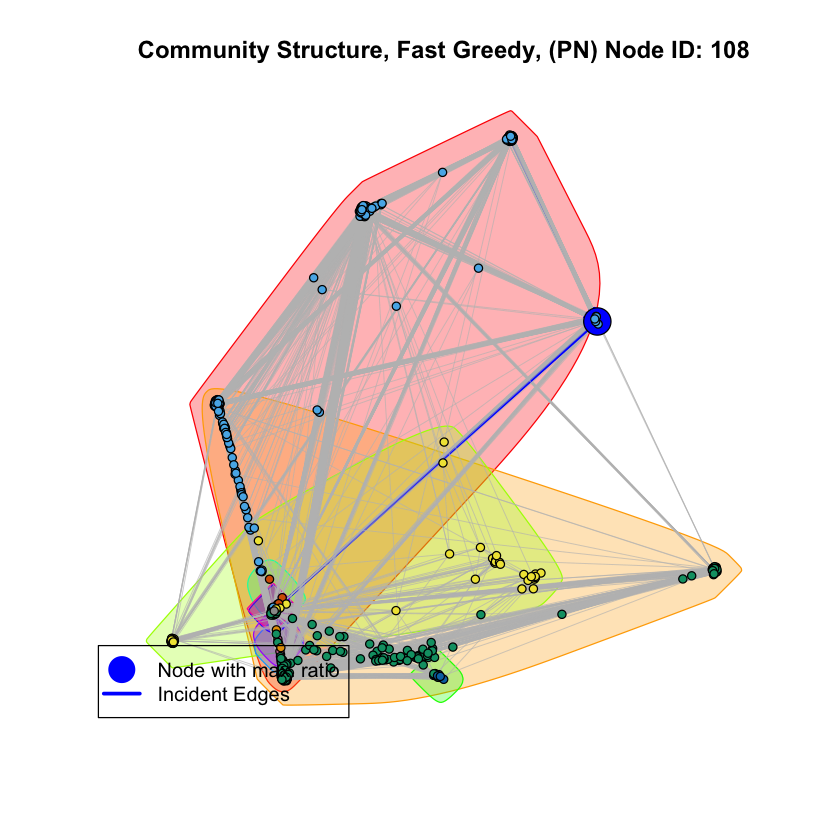

In [ ]:
el <- read.table("facebook_combined.txt",header=FALSE)
fb <- graph.data.frame(el, directed=FALSE)
node_list_str = c("0","348","483","1086","107")
for(j in c(1:5)){
    
    nodelist = unlist(ego(fb, order=1, nodes=node_list_str[j]))
    pn = induced.subgraph(fb,nodelist)
    pn$name = sort(nodelist)
    embeddedness <- c()
    disp <- c()
    deg <- c()
    i=1
    for(v in vertex_attr(pn)$name){ 
        if(v==node_list_str[j])
            next
            
        disp[i] = 0
        neh_ver = neighbors(pn, node_list_str[j])
        neh_core = neighbors(pn,v)
        inter = intersection(neh_ver, neh_core)
        embeddedness[i] = length(inter)
        
        deg[i] = degree(pn,v)
        eg2 = delete.vertices(pn, c(node_list_str[j], v))
        if(embeddedness[i]>1){
            ver = c()
            for(m in 1:length(inter)){
                ver =  c(ver,vertex_attr(pn)$name[inter[m]])
            }
            ver1=c()
            for(m in 1:length(ver)){
                ver1=c(ver1,which(vertex_attr(eg2)$name==ver[m]))
            }
            disp_mat = distances(eg2,v=ver1, to=ver1)
            disp_mat[disp_mat==Inf]<-diameter(eg2)+1
            disp[i] = sum(disp_mat)
        }
        i=i+1
        
    } 
    
    ratio = disp/embeddedness
    ratio[mapply(is.nan,ratio)]=0
    maxratio=pn$name[which(ratio==max(ratio))]
    maxnode = which(pn$name==maxratio)
    print(sprintf("ID of node with max. ratio for core node with ID %d: %d",strtoi(node_list_str[j])+1,maxnode))
    
    fc <- cluster_fast_greedy(pn)
    vert_col = fc$membership+1
    vert_col[maxnode] = "blue"
    vert_size = rep(3, length(vert_col))
    vert_size[maxnode] = 10
    edge_col = rep("grey", length(E(pn)))
    edge_col[which(get.edgelist(pn, name = FALSE)[,1] == maxnode | get.edgelist(pn, name = FALSE)[,2] == maxnode)] = "blue"
    edge_wid = rep(0.5,length(E(pn)))
    edge_wid[which(get.edgelist(pn, name = FALSE)[,1] == maxnode |  get.edgelist(pn, name = FALSE)[,2] == maxnode)] = 2;
    plot(pn,mark.groups = fc,vertex.size=vert_size,edge.arrow.size=.5,vertex.color=vert_col,edge.color = edge_col,edge.width=edge_wid,
         vertex.label="",main = sprintf("Community Structure, Fast Greedy, (PN) Node ID: %d", strtoi(node_list_str[j])+1))
    legend('bottomleft', legend = c("Node with max. ratio", "Incident Edges"),
       lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),
       col = c('blue','blue'), pt.cex=3)
    dev.copy2eps(file=sprintf('Q14b_%d.eps',j+1))
    
}

# Question 16

In [ ]:
el <- read.table("facebook_combined.txt")
g <- graph.data.frame(el, directed=FALSE)
g_pn = make_ego_graph(g, nodes=c('414'))
Nr = which(degree(g_pn[[1]]) == 24)
print(length(Nr))

[1] 11


# Question 17

In [ ]:
common.neighbors <- function(graph, i, j) {
    s_i <- neighbors(graph, i, mode = c("all"))
    s_j <- neighbors(graph, j, mode = c("all"))
    inter <- intersection(s_i, s_j)
    length(inter)
}

jaccard <- function(graph, i, j) {
    s_i <- neighbors(graph, i, mode = c("all"))
    s_j <- neighbors(graph, j, mode = c("all"))
    inter <- intersection(s_i, s_j)
    length(inter)/(length(s_i)+length(s_j))
}

adamic.adar <- function(graph, i, j) {
    s_i <- neighbors(graph, i, mode = c("all"))
    s_j <- neighbors(graph, j, mode = c("all"))
    inter <- intersection(s_i, s_j)
    sum <- 0
    for(k in inter) {
        s_k <- neighbors(graph, k, mode = c("all"))
        sum <- sum + 1/(log(length(s_k)))
    }
    sum
}

not.friends <- function(graph, i) {
    ver <- V(graph)
    s_i <- neighbors(graph, i, mode = c("all"))
    not_friend <- ver[!ver %in% s_i]
    not_friend
}

friend_recs <- function(graph, i, neighborhood_measure, num_of_recs) {
    measure <- c()
    not_friends <- not.friends(graph, i)
    for(j in not_friends){
        if(neighborhood_measure == "common"){
            measure <- c(measure, common.neighbors(graph, i, j))
        } else if(neighborhood_measure == "jaccard") {
            measure <- c(measure, jaccard(graph, i, j))
        } else if(neighborhood_measure == "adamic") {
            measure <- c(measure, adamic.adar(graph, i, j))
        }
    }
    measure_sorted <- sort(measure, decreasing = TRUE, index.return=TRUE)
    recd_friends <- not_friends[measure_sorted$ix]
    recd_friends[c(1:num_of_recs)]
}
    
select.edges <- function(graph, i, p) {
    incident_edges <-incident(graph, v=i, mode = c("all"))
    sample(incident_edges, p*degree(graph,v=i))
}

delete.edges <- function(graph, edges) {
    delete_edges(graph, edges)
}
    
add.edges <- function(graph, i, edges) {
    for(j in 1:length(edges)) {
        graph <- graph + edge(i, edges[j])
    }
    graph
}
    
accuracy <- function(graph, graph3, i) {
    s_i <- neighbors(graph, i, mode = c("all"))
    s_j <- neighbors(graph3, i, mode = c("all"))
    inter <- intersection(s_i, s_j)
    length(inter)/length(s_i)
}

rec.accuracy <- function(graph, i, p, user_list, neighborhood_measure) {
    edges_to_delete <- select.edges(graph, i, p)
    graph2 <- delete.edges(graph, edges_to_delete)
    recommended <- friend_recs(graph2, i, neighborhood_measure, length(edges_to_delete))
    graph3 <- add.edges(graph2, i, recommended)
    accuracy(graph, graph3, i)
}

In [ ]:
node_ind <- c()
eg_tmp <- g_pn[[1]]
ver_tmp <- V(eg_tmp)
for(i in 1:length(degree(eg_tmp))) {
    if(degree(eg_tmp, v=i) == 24) {
        node_ind <- c(node_ind,i)
    }
}
user_list <- ver_tmp[node_ind]
graph <- g_pn[[1]]
p <- 0.75
neighborhood_measure <- c("common", "jaccard", "adamic")

for(measure in neighborhood_measure) {
    avg <- c()
    for(i in user_list) {
        sum <- 0
        for(m in 1:10) {
            recs <- rec.accuracy(graph, i, p, user_list, measure)
            sum <- sum + recs
        }
        avg <- c(avg, sum/10)
    }
    print(measure)
    print(mean(avg))
}

[1] "common"
[1] 0.8825758
[1] "jaccard"
[1] 0.8481061
[1] "adamic"
[1] 0.882197


# Google+ network

# 18. How many personal networks are there?

In [ ]:
circle_list = list.files(path = "gplus", pattern = "*.circles")

count = 0

for (file in circle_list){
    file = paste("gplus", file, sep = "/")
    if (length(readLines(file)) > 2){
            count = count + 1
        }
}
print("The number of personal networks is:")
print(count)

[1] "The number of personal networks is:"
[1] 57


# 19. For the 3 personal networks (node ID given below), plot the in-degree and out- degree distribution of these personal networks. Do the personal networks have a similar in and out degree distribution? In this question, you should have 6 plots.
• 109327480479767108490 • 115625564993990145546 • 101373961279443806744

In [ ]:
gp1_e <- read.table("gplus/109327480479767108490.edges")
gp2_e <- read.table("gplus/115625564993990145546.edges")
gp3_e <- read.table("gplus/101373961279443806744.edges")

gp1 <- graph.data.frame(gp1_e, directed = TRUE)
gp2 <- graph.data.frame(gp2_e, directed = TRUE)
gp3 <- graph.data.frame(gp3_e, directed = TRUE)

pdf 
  2

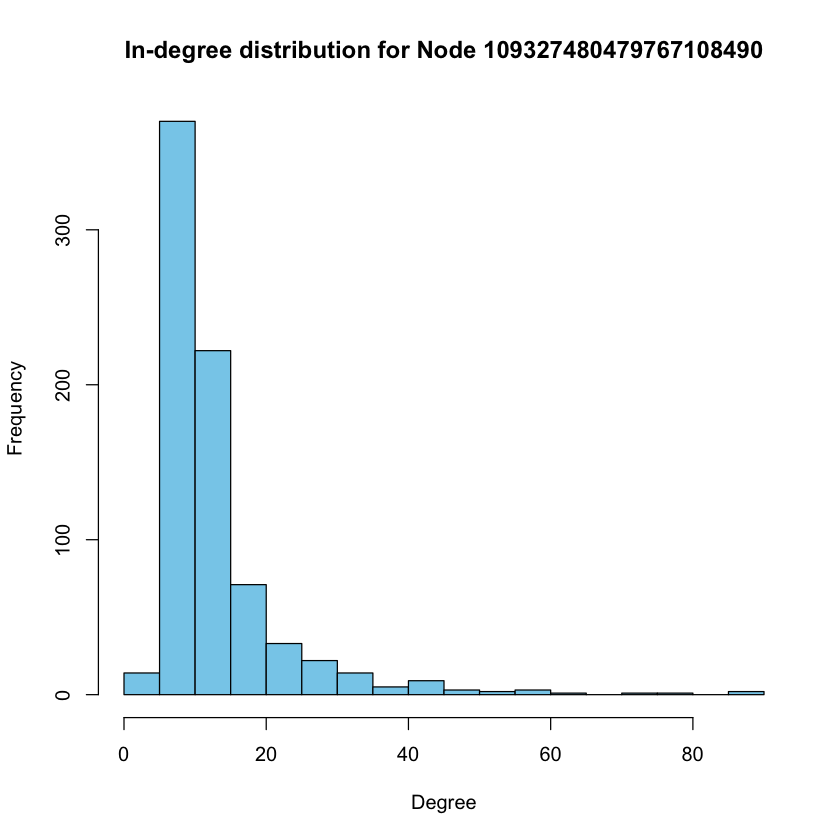

pdf 
  2

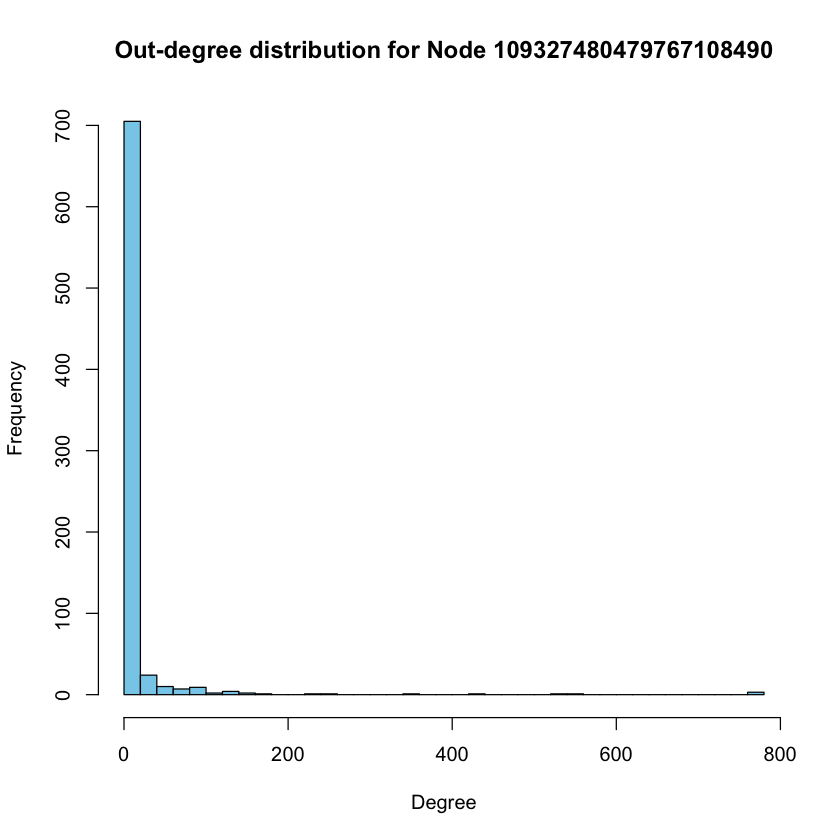

pdf 
  2

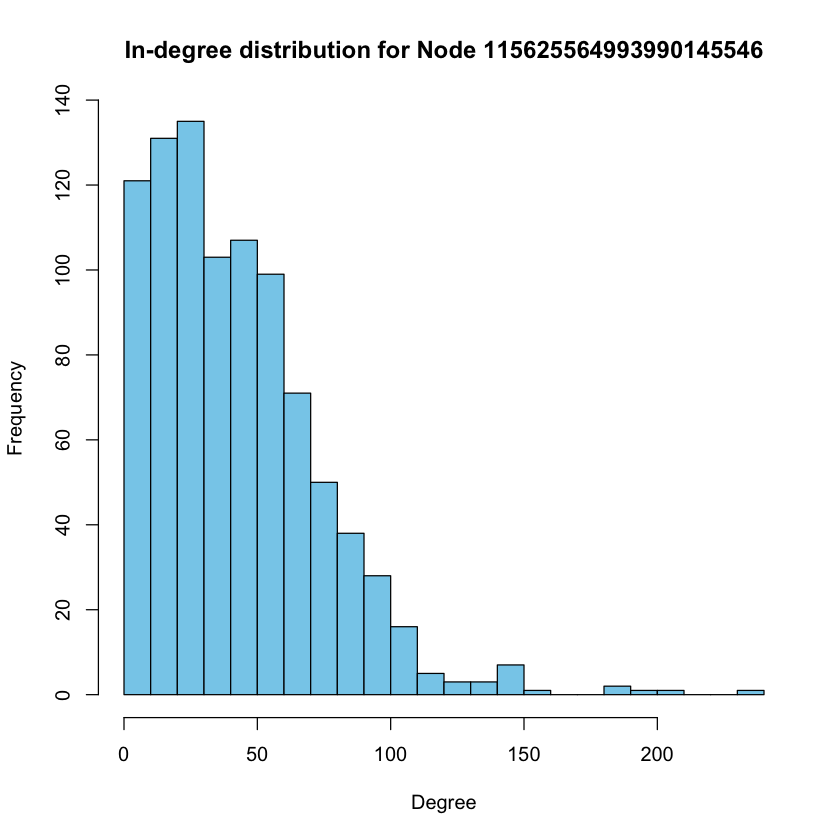

pdf 
  2

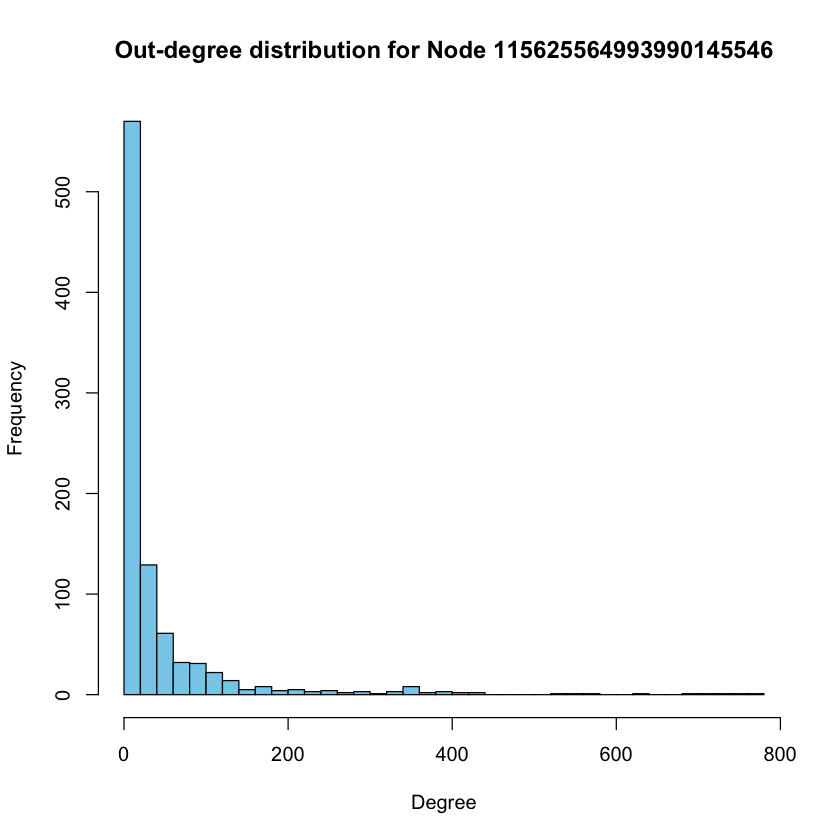

pdf 
  2

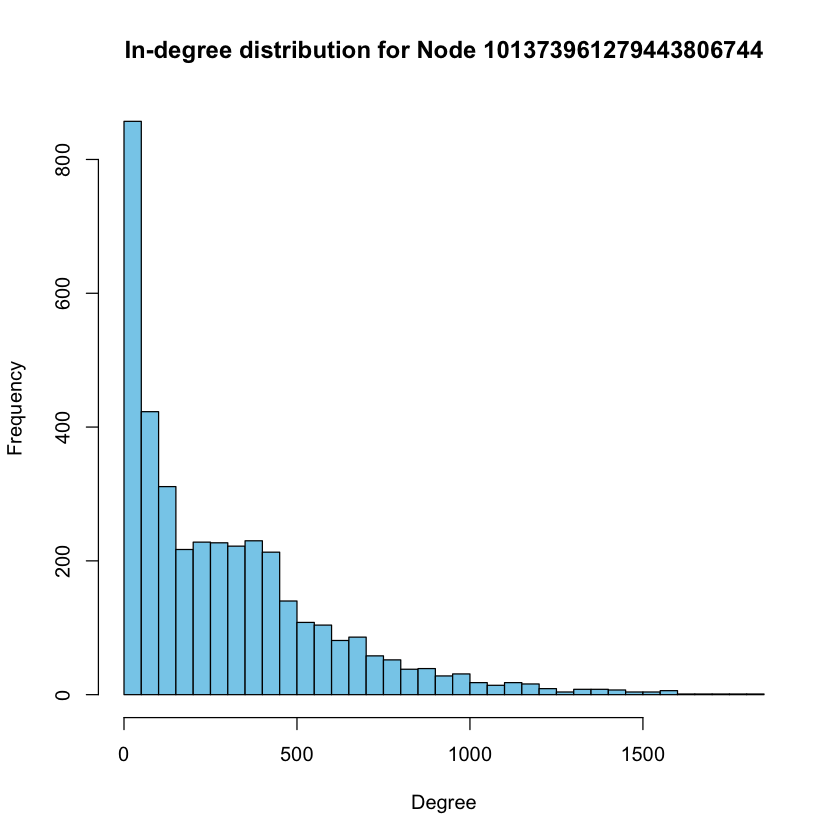

pdf 
  2

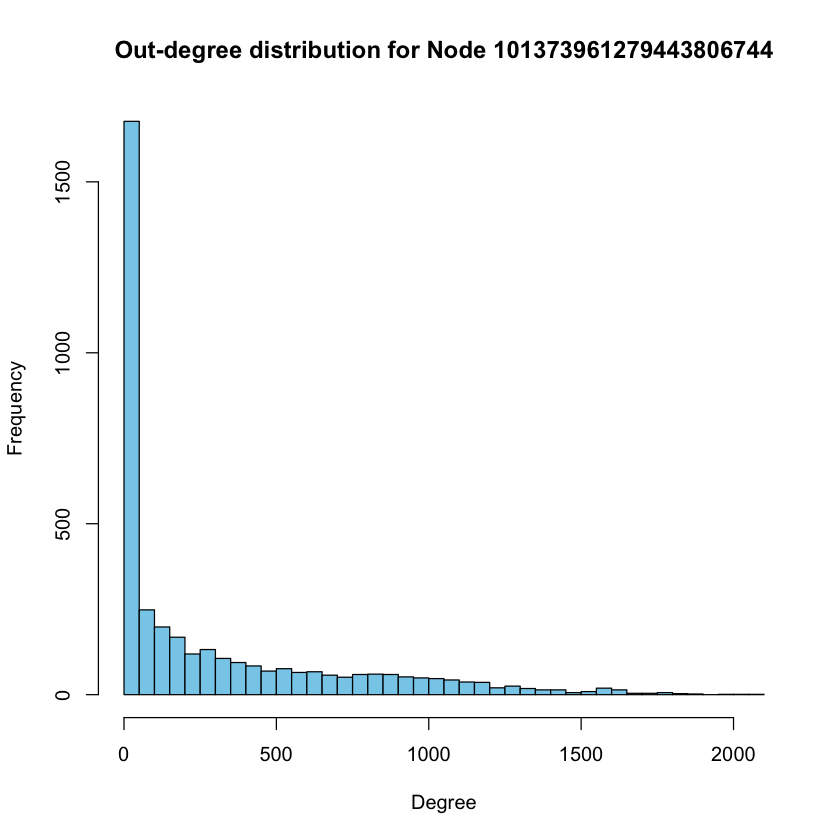

In [ ]:
hist(degree(gp1, mode = c("in")), breaks = 30, main = "In-degree distribution for Node 109327480479767108490", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19a.eps")
hist(degree(gp1, mode = c("out")), breaks = 30, main = "Out-degree distribution for Node 109327480479767108490", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19b.eps")

hist(degree(gp2, mode = c("in")), breaks = 30, main = "In-degree distribution for Node 115625564993990145546", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19c.eps")
hist(degree(gp2, mode = c("out")), breaks = 30, main = "Out-degree distribution for Node 115625564993990145546", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19d.eps")

hist(degree(gp3, mode = c("in")), breaks = 30, main = "In-degree distribution for Node 101373961279443806744", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19e.eps")
hist(degree(gp3, mode = c("out")), breaks = 30, main = "Out-degree distribution for Node 101373961279443806744", xlab = "Degree", ylab = "Frequency", col="skyblue")
dev.copy2eps(file="Q19f.eps")

# 20. For the 3 personal networks picked in Question 19, extract the community structure of each personal network using Walktrap community detection algorithm. Report the modularity scores and plot the communities using colors. Are the modularity scores similar? In this question, you should have 3 plots.


[1] "Modularity of Node 109327480479767108490:"


[1] 0.2527654

pdf 
  2

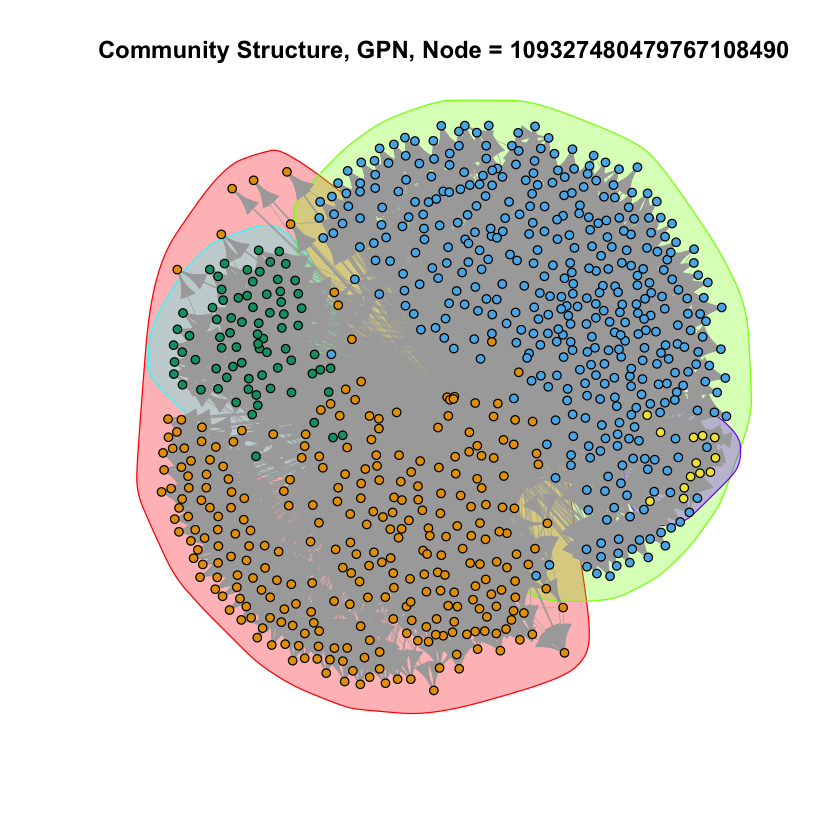

In [ ]:
gp1 <- graph.data.frame(gp1_e, directed = TRUE)
gp1 = gp1 + vertex("109327480479767108490")

for (i in seq(1, vcount(gp1) - 1, 1)){
    gp1 = gp1 +edge(vcount(gp1), i)
}

wt1 <- cluster_walktrap(gp1)
print("Modularity of Node 109327480479767108490:")
modularity(wt1)
plot(gp1, mark.groups = wt1, edge.width = 0.5, vertex.size = 3, vertex.color = wt1$membership, vertex.label = "", main = "Community Structure, GPN, Node = 109327480479767108490")
dev.copy2pdf(file="Q20a.pdf")

[1] "Modularity of Node 115625564993990145546:"


[1] 0.3194726

pdf 
  2

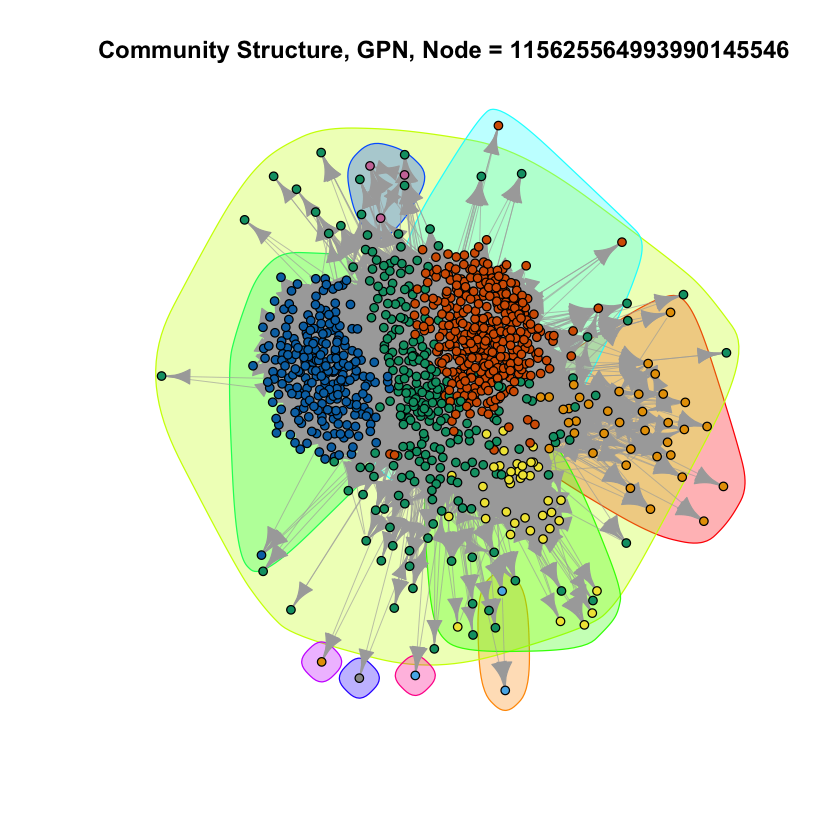

In [ ]:
gp2 <- graph.data.frame(gp2_e, directed = TRUE)
gp2 = gp2 + vertex("115625564993990145546")

for (i in seq(1, vcount(gp2) - 1, 1)){
    gp2 = gp2 +edge(vcount(gp2), i)
}

wt2 <- cluster_walktrap(gp2)
print("Modularity of Node 115625564993990145546:")
modularity(wt2)
plot(gp2, mark.groups = wt2, edge.width = 0.5, vertex.size = 3, vertex.color = wt2$membership, vertex.label = "", main = "Community Structure, GPN, Node = 115625564993990145546")
dev.copy2pdf(file="Q20b.pdf")

[1] "Modularity of Node 101373961279443806744:"


[1] 0.1910903

pdf 
  2

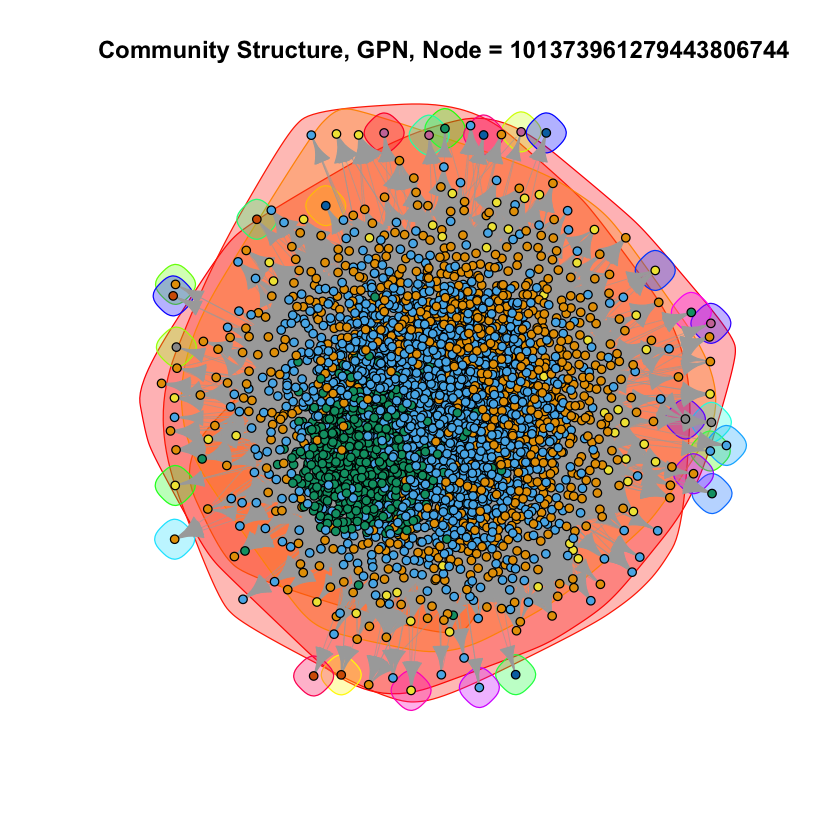

In [ ]:
gp3 <- graph.data.frame(gp3_e, directed = TRUE)
gp3 = gp3 + vertex("101373961279443806744")

for (i in seq(1, vcount(gp3) - 1, 1)){
    gp3 = gp3 + edge(vcount(gp3), i)
}

wt3 <- cluster_walktrap(gp3)
print("Modularity of Node 101373961279443806744:")
modularity(wt3)
plot(gp3, mark.groups = wt3, edge.width = 0.5, vertex.size = 3, vertex.color = wt3$membership, vertex.label = "", main = "Community Structure, GPN, Node = 101373961279443806744")
dev.copy2pdf(file="Q20c.pdf")

# 22. Compute the h and c values for the community structures of the 3 personal network (same nodes as Question 19). Interpret the values and provide a detailed explanation. Are there negative values? Why?

In [ ]:
circlefile <- readLines("gplus/109327480479767108490.circles")
circles = list()

#Obtain circles
for (j in 1:length(circlefile)) {
    circle_nodes = strsplit(circlefile[j],"\t")
    circles = c(circles, list(circle_nodes[[1]][-1]))
}

#Calculate N
all_circle <- c()
for (l in circles){
    all_circle <- c(all_circle,l)
}
all_circle <- unique(all_circle)
N <- length(all_circle)

#Calculate H(C)
h_c <- 0
for (l in circles){
    h_c<- h_c+ ((length(l)/N)* log10(length(l)/N))   
}
h_c<-h_c*-1

#Extract Community Structures
g1<-read_graph("gplus/109327480479767108490.edges",format="ncol",directed=TRUE)
g1 = add.vertices(g1, nv = 1, name = "109327480479767108490")
index = which(V(g1)$name=="109327480479767108490")
el = c()
for (vertex in 1:(vcount(g1) - 1)) {
    el = c(el, c(index, vertex))
}
g1 = add_edges(g1, el)
fg <- walktrap.community(g1)

#Find H(K),H(C|K) and H(K|C). 
percentage = vector()
percentage_circle = vector()
hck<-0
hkc<-0
hk<-0
for(m in 1:max(fg$membership)){
    community_nodes = V(g1)$name[which(fg$membership == m)]
    bi<-length(intersect(community_nodes,all_circle))
    if(bi!=0) {
    hk<- hk + ((bi/N) * log10(bi/N))
    for (n in 1:length(circles)) {
      common_nodes = intersect(community_nodes, circles[[n]])
        cij<-length(unique(common_nodes))
        ai<-length(circles[[n]])
        if(cij!=0){
            hck<-hck+ (cij/N)*log10(cij/bi)
            hkc <- hkc + (cij/N)*log10(cij/ai)
            }
        }
    }
}
hck<-hck*-1
hkc<-hkc*-1
hk<-hk*-1
# Calculate Homogenity and Completeness
h<- 1-hck/h_c
c<- 1- hkc/hk

print("h and c values for Node 109327480479767108490")
print(h)
print(c)

[1] "h and c values for Node 109327480479767108490"
[1] 0.8518851
[1] 0.3298739


In [ ]:
circlefile <- readLines("gplus/115625564993990145546.circles")
circles = list()

#Obtain circles
for (j in 1:length(circlefile)) {
    circle_nodes = strsplit(circlefile[j],"\t")
    circles = c(circles, list(circle_nodes[[1]][-1]))
}

#Calculate N
all_circle <- c()
for (l in circles){
    all_circle <- c(all_circle,l)
}
all_circle <- unique(all_circle)
N <- length(all_circle)

#Calculate H(C)
h_c <- 0
for (l in circles){
    h_c<- h_c+ ((length(l)/N)* log10(length(l)/N))   
}
h_c<-h_c*-1

#Extract Community Structures
g1<-read_graph("gplus/115625564993990145546.edges",format="ncol",directed=TRUE)
g1 = add.vertices(g1, nv = 1, name = "115625564993990145546")
index = which(V(g1)$name=="115625564993990145546")
el = c()
for (vertex in 1:(vcount(g1) - 1)) {
    el = c(el, c(index, vertex))
}
g1 = add_edges(g1, el)
fg <- walktrap.community(g1)

#Find H(K),H(C|K) and H(K|C). 
percentage = vector()
percentage_circle = vector()
hck<-0
hkc<-0
hk<-0
for(m in 1:max(fg$membership)){
    community_nodes = V(g1)$name[which(fg$membership == m)]
    bi<-length(intersect(community_nodes,all_circle))
    if(bi!=0) {
    hk<- hk + ((bi/N) * log10(bi/N))
    for (n in 1:length(circles)) {
      common_nodes = intersect(community_nodes, circles[[n]])
        cij<-length(unique(common_nodes))
        ai<-length(circles[[n]])
        if(cij!=0){
            hck<-hck+ (cij/N)*log10(cij/bi)
            hkc <- hkc + (cij/N)*log10(cij/ai)
            }
        }
    }
}
hck<-hck*-1
hkc<-hkc*-1
hk<-hk*-1
# Calculate Homogenity and Completeness
h<- 1-hck/h_c
c<- 1- hkc/hk

print("h and c values for Node 115625564993990145546")
print(h)
print(c)

[1] "h and c values for Node 115625564993990145546"
[1] 0.4518903
[1] -3.423962


In [ ]:
circlefile <- readLines("gplus/101373961279443806744.circles")
circles = list()

#Obtain circles
for (j in 1:length(circlefile)) {
    circle_nodes = strsplit(circlefile[j],"\t")
    circles = c(circles, list(circle_nodes[[1]][-1]))
}

#Calculate N
all_circle <- c()
for (l in circles){
    all_circle <- c(all_circle,l)
}
all_circle <- unique(all_circle)
N <- length(all_circle)

#Calculate H(C)
h_c <- 0
for (l in circles){
    h_c<- h_c+ ((length(l)/N)* log10(length(l)/N))   
}
h_c<-h_c*-1

#Extract Community Structures
g1<-read_graph("gplus/101373961279443806744.edges",format="ncol",directed=TRUE)
g1 = add.vertices(g1, nv = 1, name = "101373961279443806744")
index = which(V(g1)$name=="101373961279443806744")
el = c()
for (vertex in 1:(vcount(g1) - 1)) {
    el = c(el, c(index, vertex))
}
g1 = add_edges(g1, el)
fg <- walktrap.community(g1)

#Find H(K),H(C|K) and H(K|C). 
percentage = vector()
percentage_circle = vector()
hck<-0
hkc<-0
hk<-0
for(m in 1:max(fg$membership)){
    community_nodes = V(g1)$name[which(fg$membership == m)]
    bi<-length(intersect(community_nodes,all_circle))
    if(bi!=0) {
    hk<- hk + ((bi/N) * log10(bi/N))
    for (n in 1:length(circles)) {
      common_nodes = intersect(community_nodes, circles[[n]])
        cij<-length(unique(common_nodes))
        ai<-length(circles[[n]])
        if(cij!=0){
            hck<-hck+ (cij/N)*log10(cij/bi)
            hkc <- hkc + (cij/N)*log10(cij/ai)
            }
        }
    }
}
hck<-hck*-1
hkc<-hkc*-1
hk<-hk*-1
# Calculate Homogenity and Completeness
h<- 1-hck/h_c
c<- 1- hkc/hk

print("h and c values for Node 101373961279443806744")
print(h)
print(c)

[1] "h and c values for Node 101373961279443806744"
[1] 0.003866707
[1] -1.504238
